In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import joblib as jb

import warnings 
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_excel('Data_Train.xlsx')

In [3]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [5]:
df.nunique()

Airline              12
Date_of_Journey      44
Source                5
Destination           6
Route               128
Dep_Time            222
Arrival_Time       1343
Duration            368
Total_Stops           5
Additional_Info      10
Price              1870
dtype: int64

In [6]:
df.duplicated().sum()

220

In [7]:
df.drop_duplicates(inplace=True)

In [8]:
df.isna().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

In [9]:
df[df['Total_Stops'].isna()]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
9039,Air India,6/05/2019,Delhi,Cochin,NaN,09:45,09:25 07 May,23h 40m,NaN,No info,7480


In [10]:
df[(df['Source']=='Delhi')&(df['Destination']=='Cochin')][['Total_Stops']].value_counts()

Total_Stops
1 stop         3185
2 stops         924
non-stop        213
3 stops          23
Name: count, dtype: int64

In [11]:
df[(df['Source']=='Delhi')&(df['Destination']=='Cochin')][['Total_Stops','Price']].value_counts().sort_index(level=1)

Total_Stops  Price
1 stop       3876     1
             3948     1
             4098     1
             4106     2
             4201     1
                     ..
2 stops      34503    1
             34608    1
1 stop       36983    1
2 stops      46490    1
             52285    1
Name: count, Length: 1015, dtype: int64

In [12]:
df.dropna(inplace=True)

In [13]:
df[df['Total_Stops'].isna()]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price


In [14]:
df.reset_index(inplace=True,drop=True)

In [15]:
df['Additional_Info'].value_counts()

Additional_Info
No info                         8182
In-flight meal not included     1926
No check-in baggage included     318
1 Long layover                    19
Change airports                    7
Business class                     4
No Info                            3
1 Short layover                    1
Red-eye flight                     1
2 Long layover                     1
Name: count, dtype: int64

In [16]:
for col in df.columns:
    print(df[col].value_counts(),'\n','_'*50)

Airline
Jet Airways                          3700
IndiGo                               2043
Air India                            1694
Multiple carriers                    1196
SpiceJet                              815
Vistara                               478
Air Asia                              319
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: count, dtype: int64 
 __________________________________________________
Date_of_Journey
6/06/2019     490
18/05/2019    486
9/06/2019     485
12/06/2019    483
21/05/2019    482
9/05/2019     466
21/03/2019    412
15/05/2019    402
27/05/2019    369
27/06/2019    339
24/06/2019    330
1/06/2019     330
3/06/2019     326
15/06/2019    314
24/03/2019    314
6/03/2019     302
27/03/2019    290
24/05/2019    286
6/05/2019     281
1/05/2019     274
12/05/2019    259
1/04/2019     2

- Date_of_Journey is date but it's data type is object
- Arrival_Time some data in it has a date and time of arrival. some data is wrong(arrival date is before journey date)
- Duration need to be calculated by hours and be numeric.
- Total_Stops to be transformed as numeric
- Additional_Info 

* **Date_of_Journey**

In [17]:
df[df['Date_of_Journey'].str.startswith('0')]['Date_of_Journey'].value_counts()

Date_of_Journey
01/03/2019    151
09/03/2019    100
06/03/2019     95
03/03/2019     92
Name: count, dtype: int64

In [18]:
df['Date_of_Journey'] = df['Date_of_Journey'].apply(lambda x: x[1:] if x.startswith('0') else x)

In [19]:
df['Date_of_Journey'].value_counts()

Date_of_Journey
6/06/2019     490
18/05/2019    486
9/06/2019     485
12/06/2019    483
21/05/2019    482
9/05/2019     466
21/03/2019    412
15/05/2019    402
6/03/2019     397
27/05/2019    369
27/06/2019    339
24/06/2019    330
1/06/2019     330
3/06/2019     326
24/03/2019    314
15/06/2019    314
3/03/2019     309
9/03/2019     299
27/03/2019    290
24/05/2019    286
6/05/2019     281
1/05/2019     274
12/05/2019    259
1/04/2019     256
1/03/2019     198
15/03/2019    162
18/03/2019    156
12/03/2019    141
9/04/2019     125
3/04/2019     110
21/06/2019    109
18/06/2019    105
6/04/2019     100
27/04/2019     94
24/04/2019     92
3/05/2019      90
15/04/2019     89
21/04/2019     82
18/04/2019     67
12/04/2019     63
Name: count, dtype: int64

In [20]:
df['Date_of_Journey'] = pd.to_datetime(df['Date_of_Journey'])

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10462 entries, 0 to 10461
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Airline          10462 non-null  object        
 1   Date_of_Journey  10462 non-null  datetime64[ns]
 2   Source           10462 non-null  object        
 3   Destination      10462 non-null  object        
 4   Route            10462 non-null  object        
 5   Dep_Time         10462 non-null  object        
 6   Arrival_Time     10462 non-null  object        
 7   Duration         10462 non-null  object        
 8   Total_Stops      10462 non-null  object        
 9   Additional_Info  10462 non-null  object        
 10  Price            10462 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(9)
memory usage: 899.2+ KB


In [22]:
df['Date_of_Journey'].dt.year.value_counts()

Date_of_Journey
2019    10462
Name: count, dtype: int64

In [23]:
df['Date_of_Journey'].dt.month.value_counts()

Date_of_Journey
5    3395
6    3311
3    2678
4    1078
Name: count, dtype: int64

In [24]:
 df['Date_of_Journey'].dt.day.value_counts()

Date_of_Journey
9     1375
6     1268
27    1092
21    1085
1     1058
24    1022
15     967
12     946
3      835
18     814
Name: count, dtype: int64

##### Feature Extraction

In [25]:
df['day_of_journey'] = df['Date_of_Journey'].dt.day

In [26]:
df['month_of_journey'] = df['Date_of_Journey'].dt.month

* **Arrival_Time**

###### separate date and time each in a column

In [27]:
(df['Arrival_Time']).str.split().value_counts()

Arrival_Time
[19:00]             412
[21:00]             360
[19:15]             333
[16:10]             154
[12:35]             122
                   ... 
[00:50, 04, May]      1
[00:50, 02, Jun]      1
[00:25, 02, Jun]      1
[08:55, 13, Mar]      1
[21:20, 13, Mar]      1
Name: count, Length: 1343, dtype: int64

In [28]:
def arrival_date(x):
    try:
        if x.split()[1] != None:
            date = ' '.join(x.split()[1:])
        return date + ' 2019'
    except IndexError:
        return None

In [29]:
df['Arrival_Time'].apply(arrival_date).value_counts()

Arrival_Time
10 Jun 2019    234
22 May 2019    230
19 May 2019    226
07 Jun 2019    225
13 Jun 2019    222
10 May 2019    216
07 Mar 2019    199
16 May 2019    160
28 May 2019    140
22 Mar 2019    130
25 May 2019    129
07 May 2019    128
25 Jun 2019    127
02 Jun 2019    127
28 Jun 2019    127
25 Mar 2019    125
02 May 2019    123
04 Jun 2019    122
28 Mar 2019    118
13 Mar 2019    114
02 Apr 2019    114
16 Jun 2019    114
13 May 2019    112
10 Mar 2019     98
04 Mar 2019     79
02 Mar 2019     75
16 Mar 2019     73
10 Apr 2019     47
19 Mar 2019     43
04 Apr 2019     19
07 Apr 2019     17
28 Apr 2019     13
22 Jun 2019     13
19 Jun 2019     12
25 Apr 2019     10
19 Apr 2019     10
04 May 2019     10
22 Apr 2019     10
16 Apr 2019      9
08 Mar 2019      8
13 Apr 2019      8
23 Mar 2019      6
29 Jun 2019      3
20 May 2019      2
05 Mar 2019      2
11 May 2019      2
26 May 2019      2
29 May 2019      2
29 Mar 2019      2
03 May 2019      1
03 Mar 2019      1
26 Jun 2019      1

In [30]:
df['arrival_date'] = df['Arrival_Time'].apply(arrival_date)

In [31]:
df['arrival_date'].value_counts()

arrival_date
10 Jun 2019    234
22 May 2019    230
19 May 2019    226
07 Jun 2019    225
13 Jun 2019    222
10 May 2019    216
07 Mar 2019    199
16 May 2019    160
28 May 2019    140
22 Mar 2019    130
25 May 2019    129
07 May 2019    128
25 Jun 2019    127
02 Jun 2019    127
28 Jun 2019    127
25 Mar 2019    125
02 May 2019    123
04 Jun 2019    122
28 Mar 2019    118
13 Mar 2019    114
02 Apr 2019    114
16 Jun 2019    114
13 May 2019    112
10 Mar 2019     98
04 Mar 2019     79
02 Mar 2019     75
16 Mar 2019     73
10 Apr 2019     47
19 Mar 2019     43
04 Apr 2019     19
07 Apr 2019     17
28 Apr 2019     13
22 Jun 2019     13
19 Jun 2019     12
25 Apr 2019     10
19 Apr 2019     10
04 May 2019     10
22 Apr 2019     10
16 Apr 2019      9
08 Mar 2019      8
13 Apr 2019      8
23 Mar 2019      6
29 Jun 2019      3
20 May 2019      2
05 Mar 2019      2
11 May 2019      2
26 May 2019      2
29 May 2019      2
29 Mar 2019      2
03 May 2019      1
03 Mar 2019      1
26 Jun 2019      1

In [32]:
df['arrival_date'] = pd.to_datetime(df['arrival_date'])

In [33]:
#pd.to_datetime((df['Arrival_Time']).apply(arrival_date))

In [34]:
df['Arrival_Time'] = df['Arrival_Time'].apply(lambda x: x.split()[0])

In [35]:
df['Arrival_Time'].value_counts()

Arrival_Time
19:00    590
19:15    533
04:25    512
12:35    408
21:00    360
        ... 
13:10      1
11:15      1
03:40      1
16:00      1
11:35      1
Name: count, Length: 223, dtype: int64

###### clean records that is wrong data

In [36]:
df[df['Date_of_Journey']>df['arrival_date']][:60]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date
0,IndiGo,2019-03-24,Banglore,New Delhi,BLR → DEL,22:20,01:10,2h 50m,non-stop,No info,3897,24,3,2019-03-22
21,Air India,2019-03-21,Banglore,New Delhi,BLR → COK → DEL,22:00,13:20,15h 20m,1 stop,No info,6955,21,3,2019-03-19
110,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,14:05,05:05,15h,1 stop,No info,13555,18,3,2019-03-16
379,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,16:55,09:00,16h 5m,1 stop,In-flight meal not included,11087,18,3,2019-03-16
605,Air India,2019-03-21,Banglore,New Delhi,BLR → COK → DEL,22:00,10:50,12h 50m,1 stop,No info,6955,21,3,2019-03-19
628,Jet Airways,2019-03-15,Banglore,New Delhi,BLR → BOM → DEL,22:55,05:05,6h 10m,1 stop,No info,27210,15,3,2019-03-13
1113,Air India,2019-03-21,Banglore,New Delhi,BLR → MAA → DEL,11:50,08:55,21h 5m,1 stop,No info,5092,21,3,2019-03-19
1266,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,07:00,07:40,24h 40m,1 stop,No info,11455,18,3,2019-03-16
1316,Air India,2019-03-18,Banglore,New Delhi,BLR → CCU → GAU → DEL,11:05,22:10,35h 5m,2 stops,No info,11161,18,3,2019-03-16
1351,IndiGo,2019-03-21,Banglore,New Delhi,BLR → BOM → DEL,19:35,00:35,5h,1 stop,No info,6575,21,3,2019-03-19


In [37]:
df[df['Date_of_Journey']>df['arrival_date']][60:]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date
7428,Air India,2019-03-21,Banglore,New Delhi,BLR → MAA → DEL,11:50,13:00,25h 10m,1 stop,No info,5092,21,3,2019-03-19
7485,Jet Airways,2019-03-21,Banglore,New Delhi,BLR → BOM → DEL,18:40,07:40,13h,1 stop,In-flight meal not included,7832,21,3,2019-03-19
7511,Air India,2019-03-18,Banglore,New Delhi,BLR → BOM → BHO → DEL,08:50,23:25,38h 35m,2 stops,No info,10783,18,3,2019-03-16
7634,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,14:05,07:40,17h 35m,1 stop,In-flight meal not included,10972,18,3,2019-03-16
7890,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,11:40,10:25,22h 45m,1 stop,In-flight meal not included,11087,18,3,2019-03-16
7957,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,11:40,09:30,21h 50m,1 stop,In-flight meal not included,11087,18,3,2019-03-16
8064,Air India,2019-03-24,Banglore,New Delhi,BLR → HYD → VGA → DEL,17:00,22:55,29h 55m,2 stops,No info,8114,24,3,2019-03-19
8471,Air India,2019-03-18,Banglore,New Delhi,BLR → BOM → NAG → DEL,06:45,10:35,27h 50m,2 stops,No info,12305,18,3,2019-03-16
8792,Jet Airways,2019-03-18,Banglore,New Delhi,BLR → BOM → DEL,14:05,08:15,18h 10m,1 stop,No info,12284,18,3,2019-03-16
9044,Air India,2019-03-21,Banglore,New Delhi,BLR → HYD → VGA → DEL,08:15,11:20,27h 5m,2 stops,No info,7642,21,3,2019-03-19


In [38]:
df.drop(df[df['Date_of_Journey']>df['arrival_date']].index, inplace=True)

In [39]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date
1,Air India,2019-05-01,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,1,5,NaT
2,Jet Airways,2019-06-09,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25,19h,2 stops,No info,13882,9,6,2019-06-10
3,IndiGo,2019-05-12,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,12,5,NaT
4,IndiGo,2019-03-01,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,1,3,NaT
5,SpiceJet,2019-06-24,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873,24,6,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10457,Air Asia,2019-04-09,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107,9,4,NaT
10458,Air India,2019-04-27,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145,27,4,NaT
10459,Jet Airways,2019-04-27,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229,27,4,NaT
10460,Vistara,2019-03-01,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648,1,3,NaT


In [40]:
df.reset_index(drop=True , inplace=True)

In [41]:
df['arrival_date'].value_counts()

arrival_date
2019-06-10    234
2019-05-22    230
2019-05-19    226
2019-06-07    225
2019-06-13    222
2019-05-10    216
2019-03-07    198
2019-05-16    160
2019-05-28    140
2019-05-25    129
2019-05-07    128
2019-06-02    127
2019-06-25    127
2019-06-28    127
2019-03-22    126
2019-03-25    125
2019-05-02    123
2019-06-04    122
2019-03-28    118
2019-06-16    114
2019-04-02    113
2019-05-13    112
2019-03-13    109
2019-03-10     98
2019-03-04     79
2019-03-02     75
2019-04-10     47
2019-03-16     30
2019-04-04     19
2019-04-07     17
2019-04-28     13
2019-06-22     13
2019-06-19     12
2019-04-22     10
2019-05-04     10
2019-04-19     10
2019-04-25     10
2019-04-16      9
2019-04-13      8
2019-03-08      8
2019-03-19      8
2019-03-23      6
2019-06-29      3
2019-03-29      2
2019-05-29      2
2019-05-20      2
2019-05-26      2
2019-03-05      2
2019-05-11      2
2019-06-26      1
2019-03-03      1
2019-05-03      1
2019-05-23      1
2019-06-17      1
Name: count, dt

In [42]:
df['arrival_date'].isna().sum()

6320

In [43]:
df['Date_of_Journey'].compare(df['arrival_date']).value_counts()

self        other     
2019-06-09  2019-06-10    234
2019-05-21  2019-05-22    230
2019-05-18  2019-05-19    226
2019-06-06  2019-06-07    225
2019-06-12  2019-06-13    222
2019-05-09  2019-05-10    216
2019-03-06  2019-03-07    176
2019-05-15  2019-05-16    160
2019-05-27  2019-05-28    140
2019-05-24  2019-05-25    129
2019-05-06  2019-05-07    128
2019-06-01  2019-06-02    127
2019-06-27  2019-06-28    127
2019-06-24  2019-06-25    127
2019-03-21  2019-03-22    126
2019-03-24  2019-03-25    125
2019-05-01  2019-05-02    123
2019-06-03  2019-06-04    122
2019-06-15  2019-06-16    114
2019-03-27  2019-03-28    113
2019-04-01  2019-04-02    113
2019-05-12  2019-05-13    112
2019-03-09  2019-03-10     98
2019-03-12  2019-03-13     84
2019-03-03  2019-03-04     79
2019-03-01  2019-03-02     75
2019-04-09  2019-04-10     47
2019-03-15  2019-03-16     30
2019-03-09  2019-03-13     25
2019-03-03  2019-03-07     22
2019-04-03  2019-04-04     19
2019-04-06  2019-04-07     17
2019-04-27  2019-

In [44]:
df[(df['Date_of_Journey']=='2019-03-09')& (df['arrival_date']=='13 Mar 2019')]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date
69,Jet Airways,2019-03-09,Banglore,New Delhi,BLR → BOM → DEL,05:45,08:15,26h 30m,1 stop,In-flight meal not included,9134,9,3,2019-03-13
1107,IndiGo,2019-03-09,Banglore,New Delhi,BLR → DEL,21:20,00:15,2h 55m,non-stop,No info,4777,9,3,2019-03-13
1495,Jet Airways,2019-03-09,Banglore,New Delhi,BLR → MAA → DEL,09:45,00:30,14h 45m,1 stop,In-flight meal not included,10562,9,3,2019-03-13
1507,Jet Airways,2019-03-09,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:45,25h 50m,1 stop,In-flight meal not included,11087,9,3,2019-03-13
1724,Air India,2019-03-09,Banglore,New Delhi,BLR → HYD → DEL,06:50,08:50,26h,1 stop,No info,5626,9,3,2019-03-13
1816,Air India,2019-03-09,Banglore,New Delhi,BLR → GOI → DEL,17:00,16:40,23h 40m,1 stop,No info,9292,9,3,2019-03-13
2040,Jet Airways,2019-03-09,Banglore,New Delhi,BLR → BOM → DEL,21:25,07:40,10h 15m,1 stop,In-flight meal not included,7832,9,3,2019-03-13
2426,IndiGo,2019-03-09,Banglore,New Delhi,BLR → DEL,22:20,01:10,2h 50m,non-stop,No info,4377,9,3,2019-03-13
2492,Jet Airways,2019-03-09,Banglore,New Delhi,BLR → BOM → DEL,08:00,09:30,25h 30m,1 stop,In-flight meal not included,11087,9,3,2019-03-13
3651,IndiGo,2019-03-09,Banglore,New Delhi,BLR → GOI → DEL,19:30,00:40,5h 10m,1 stop,No info,7280,9,3,2019-03-13


In [45]:
df[(df['arrival_date'].dt.day-df['Date_of_Journey'].dt.day)>2]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date
50,IndiGo,2019-03-24,Banglore,New Delhi,BLR → DEL,22:20,01:10,2h 50m,non-stop,No info,4377,24,3,2019-03-28
69,Jet Airways,2019-03-09,Banglore,New Delhi,BLR → BOM → DEL,05:45,08:15,26h 30m,1 stop,In-flight meal not included,9134,9,3,2019-03-13
850,IndiGo,2019-03-24,Banglore,New Delhi,BLR → DEL,21:20,00:15,2h 55m,non-stop,No info,5694,24,3,2019-03-28
984,Air India,2019-03-03,Banglore,New Delhi,BLR → CCU → GAU → DEL,11:05,22:10,35h 5m,2 stops,No info,11791,3,3,2019-03-07
1014,Air Asia,2019-03-24,Banglore,New Delhi,BLR → DEL,23:25,02:10,2h 45m,non-stop,No info,4482,24,3,2019-03-28
1107,IndiGo,2019-03-09,Banglore,New Delhi,BLR → DEL,21:20,00:15,2h 55m,non-stop,No info,4777,9,3,2019-03-13
1495,Jet Airways,2019-03-09,Banglore,New Delhi,BLR → MAA → DEL,09:45,00:30,14h 45m,1 stop,In-flight meal not included,10562,9,3,2019-03-13
1507,Jet Airways,2019-03-09,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:45,25h 50m,1 stop,In-flight meal not included,11087,9,3,2019-03-13
1724,Air India,2019-03-09,Banglore,New Delhi,BLR → HYD → DEL,06:50,08:50,26h,1 stop,No info,5626,9,3,2019-03-13
1816,Air India,2019-03-09,Banglore,New Delhi,BLR → GOI → DEL,17:00,16:40,23h 40m,1 stop,No info,9292,9,3,2019-03-13


In [46]:
df.drop(df[(df['arrival_date'].dt.day-df['Date_of_Journey'].dt.day)>2].index , inplace=True)

In [47]:
df[(df['arrival_date'].dt.day-df['Date_of_Journey'].dt.day)>2]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date


In [48]:
df[(df['arrival_date'].dt.day-df['Date_of_Journey'].dt.day)>1]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date
206,Jet Airways,2019-05-18,Delhi,Cochin,DEL → AMD → BOM → COK,23:05,04:25,29h 20m,2 stops,No info,15129,18,5,2019-05-20
466,Jet Airways,2019-03-21,Delhi,Cochin,DEL → UDR → BOM → COK,18:20,04:25,34h 5m,2 stops,No info,13082,21,3,2019-03-23
584,Jet Airways,2019-05-09,Delhi,Cochin,DEL → AMD → BOM → COK,23:05,04:25,29h 20m,2 stops,No info,16704,9,5,2019-05-11
695,Jet Airways,2019-05-01,Delhi,Cochin,DEL → AMD → BOM → COK,23:05,04:25,29h 20m,2 stops,No info,16704,1,5,2019-05-03
815,Jet Airways,2019-05-09,Delhi,Cochin,DEL → AMD → BOM → COK,23:05,04:25,29h 20m,2 stops,No info,15129,9,5,2019-05-11
918,Jet Airways,2019-03-06,Delhi,Cochin,DEL → DED → BOM → COK,16:50,04:25,35h 35m,2 stops,No info,19907,6,3,2019-03-08
968,Jet Airways,2019-03-01,Banglore,New Delhi,BLR → BOM → DEL,22:50,00:45,25h 55m,1 stop,No info,26890,1,3,2019-03-03
1059,Jet Airways,2019-03-03,Delhi,Cochin,DEL → IDR → BOM → COK,05:25,04:25,47h,2 stops,No info,20064,3,3,2019-03-05
1494,Jet Airways,2019-03-06,Delhi,Cochin,DEL → AMD → BOM → COK,19:10,04:25,33h 15m,2 stops,In-flight meal not included,16022,6,3,2019-03-08
1623,Jet Airways,2019-05-18,Delhi,Cochin,DEL → AMD → BOM → COK,23:05,04:25,29h 20m,2 stops,No info,16704,18,5,2019-05-20


In [49]:
df.reset_index(drop=True,inplace=True)

In [50]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date
0,Air India,2019-05-01,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,1,5,NaT
1,Jet Airways,2019-06-09,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25,19h,2 stops,No info,13882,9,6,2019-06-10
2,IndiGo,2019-05-12,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,12,5,NaT
3,IndiGo,2019-03-01,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,1,3,NaT
4,SpiceJet,2019-06-24,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873,24,6,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10316,Air Asia,2019-04-09,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107,9,4,NaT
10317,Air India,2019-04-27,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145,27,4,NaT
10318,Jet Airways,2019-04-27,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229,27,4,NaT
10319,Vistara,2019-03-01,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648,1,3,NaT


##### Feature Extraction

In [51]:
df['arrival_day'] = df['arrival_date'].dt.day

In [52]:
df['arrival_day'].fillna(df['day_of_journey'],inplace=True)

In [53]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,arrival_date,arrival_day
0,Air India,2019-05-01,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662,1,5,NaT,1.0
1,Jet Airways,2019-06-09,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25,19h,2 stops,No info,13882,9,6,2019-06-10,10.0
2,IndiGo,2019-05-12,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218,12,5,NaT,12.0
3,IndiGo,2019-03-01,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302,1,3,NaT,1.0
4,SpiceJet,2019-06-24,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873,24,6,NaT,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10316,Air Asia,2019-04-09,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107,9,4,NaT,9.0
10317,Air India,2019-04-27,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145,27,4,NaT,27.0
10318,Jet Airways,2019-04-27,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229,27,4,NaT,27.0
10319,Vistara,2019-03-01,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648,1,3,NaT,1.0


In [54]:
(df['arrival_day'] - df['day_of_journey']).value_counts()

0.0    6320
1.0    3967
2.0      34
Name: count, dtype: int64

In [55]:
df['count_journey_days'] = df['arrival_day'] - df['day_of_journey']

In [56]:
df['count_journey_days'].value_counts()

count_journey_days
0.0    6320
1.0    3967
2.0      34
Name: count, dtype: int64

In [57]:
df.drop(['arrival_date','arrival_day'],axis=1,inplace=True)

##### Feature Extraction

**Dep_Time**

In [58]:
def day_parts(x):
    h = int(x.split(':')[0])
    if h <= 4:
        return "mid night"
    elif h <= 7:
        return "early morning"
    elif h <= 11:
        return "morning"
    elif h<= 17:
        return 'afternoon'
    elif h <= 22:
        return "evening"
    elif h <= 23:
        return "night"

In [59]:
df['dep_day_part'] = df['Dep_Time'].apply(day_parts)

In [60]:
df['dep_day_part'].value_counts()

dep_day_part
morning          2644
afternoon        2541
evening          2441
early morning    2105
mid night         464
night             126
Name: count, dtype: int64

**Arrival_Time**

In [61]:
df['arrival_day_part'] = df['Arrival_Time'].apply(day_parts)

In [62]:
df['arrival_day_part'].value_counts()

arrival_day_part
evening          3780
afternoon        2193
mid night        1702
morning          1663
early morning     506
night             477
Name: count, dtype: int64

* **Duration**

In [63]:
'''def duration(x):
    #try:
        h = x.strip().split('h')
        if len(h)==2:
            
             return   (int(h[0]) + int(h[1].strip().split('m')[0].strip())/60)
            
        elif len(x.strip().split('h'))==1:
         
               return int(h[0])'''
            
'''
    except:
            m= x.strip().split('m')
            return int(m[0])'''

"\n    except:\n            m= x.strip().split('m')\n            return int(m[0])"

In [64]:
(~df['Duration'].str.contains('h')).sum()

1

In [65]:
df[~df['Duration'].str.contains('h')]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,count_journey_days,dep_day_part,arrival_day_part
6312,Air India,2019-03-06,Mumbai,Hyderabad,BOM → GOI → PNQ → HYD,16:50,16:55,5m,2 stops,No info,17327,6,3,0.0,afternoon,afternoon


In [66]:
df.iloc[6312]

Airline                           Air India
Date_of_Journey         2019-03-06 00:00:00
Source                               Mumbai
Destination                       Hyderabad
Route                 BOM → GOI → PNQ → HYD
Dep_Time                              16:50
Arrival_Time                          16:55
Duration                                 5m
Total_Stops                         2 stops
Additional_Info                     No info
Price                                 17327
day_of_journey                            6
month_of_journey                          3
count_journey_days                      0.0
dep_day_part                      afternoon
arrival_day_part                  afternoon
Name: 6312, dtype: object

- ofcourse there is no flight takes only 5 minutes

In [67]:
df.iloc[1]

Airline                         Jet Airways
Date_of_Journey         2019-06-09 00:00:00
Source                                Delhi
Destination                          Cochin
Route                 DEL → LKO → BOM → COK
Dep_Time                              09:25
Arrival_Time                          04:25
Duration                                19h
Total_Stops                         2 stops
Additional_Info                     No info
Price                                 13882
day_of_journey                            9
month_of_journey                          6
count_journey_days                      1.0
dep_day_part                        morning
arrival_day_part                  mid night
Name: 1, dtype: object

In [68]:
df.drop(df[~df['Duration'].str.contains('h')].index ,inplace=True)

In [69]:
df[~df['Duration'].str.contains('h')]

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,count_journey_days,dep_day_part,arrival_day_part


In [70]:
df.reset_index(drop=True,inplace=True)

In [71]:
def duration(x):
    if 'h' in x and 'm' in x:
        h = x.strip().split('h')
        
        return round(int(h[0]) + int(h[1].strip().split('m')[0].strip()) / 60 , 2)
    elif 'h' in x:
        return int(x.split('h')[0])
    '''elif 'm' in x:
        return round(int(x.split('m')[0])/60 , 2)'''

In [72]:
df['Duration'] = df['Duration'].apply(duration)

In [73]:
df['Duration'].value_counts()

Duration
2.83     537
1.50     385
2.75     331
2.58     329
2.92     324
        ... 
19.83      1
30.17      1
31.50      1
30.42      1
47.67      1
Name: count, Length: 364, dtype: int64

In [74]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price,day_of_journey,month_of_journey,count_journey_days,dep_day_part,arrival_day_part
0,Air India,2019-05-01,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7.42,2 stops,No info,7662,1,5,0.0,early morning,afternoon
1,Jet Airways,2019-06-09,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25,19.00,2 stops,No info,13882,9,6,1.0,morning,mid night
2,IndiGo,2019-05-12,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5.42,1 stop,No info,6218,12,5,0.0,evening,night
3,IndiGo,2019-03-01,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4.75,1 stop,No info,13302,1,3,0.0,afternoon,evening
4,SpiceJet,2019-06-24,Kolkata,Banglore,CCU → BLR,09:00,11:25,2.42,non-stop,No info,3873,24,6,0.0,morning,morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10315,Air Asia,2019-04-09,Kolkata,Banglore,CCU → BLR,19:55,22:25,2.50,non-stop,No info,4107,9,4,0.0,evening,evening
10316,Air India,2019-04-27,Kolkata,Banglore,CCU → BLR,20:45,23:20,2.58,non-stop,No info,4145,27,4,0.0,evening,night
10317,Jet Airways,2019-04-27,Banglore,Delhi,BLR → DEL,08:20,11:20,3.00,non-stop,No info,7229,27,4,0.0,morning,morning
10318,Vistara,2019-03-01,Banglore,New Delhi,BLR → DEL,11:30,14:10,2.67,non-stop,No info,12648,1,3,0.0,morning,afternoon


* **Additional_Info**

In [75]:
df['Additional_Info'].value_counts()

Additional_Info
No info                         8092
In-flight meal not included     1874
No check-in baggage included     318
1 Long layover                    19
Change airports                    7
Business class                     4
No Info                            3
1 Short layover                    1
Red-eye flight                     1
2 Long layover                     1
Name: count, dtype: int64

##### Feature Extraction

In [76]:
df['check-in baggage included'] = df['Additional_Info'].apply(lambda x: 0 if x=='No check-in baggage included' else 1)

In [77]:
df['check-in baggage included'].value_counts()

check-in baggage included
1    10002
0      318
Name: count, dtype: int64

In [78]:
df['In-flight meal'] = df['Additional_Info'].apply(lambda x: 0 if x=='In-flight meal not included' else 1)

In [79]:
df['In-flight meal'].value_counts()

In-flight meal
1    8446
0    1874
Name: count, dtype: int64

In [80]:
df['Change airports'] = df['Additional_Info'].apply(lambda x: 1 if x== 'Change airports' else 0)

In [81]:
df['Change airports'].value_counts()

Change airports
0    10313
1        7
Name: count, dtype: int64

In [82]:
df['Business class'] = df['Additional_Info'].apply(lambda x: 1 if x== 'Business class' else 0)

In [83]:
df['Business class'].value_counts()

Business class
0    10316
1        4
Name: count, dtype: int64

In [84]:
def layover(x):
    if x == '1 Short layover':
        return 1
    elif x == '1 Long layover':
        return 2
    elif x == '2 Long layover':
        return 3
    else:
        return 0

In [85]:
df['layover'] = df['Additional_Info'].apply(layover)

In [86]:
df['layover'].value_counts()

layover
0    10299
2       19
1        1
3        1
Name: count, dtype: int64

In [87]:
df.drop('Additional_Info',axis=1,inplace=True)

In [88]:
#df['Additional_Info'] = df['Additional_Info'].apply(lambda x: x.replace('No Info','No info'))

In [89]:
#df[(df['Additional_Info']=='1 Long layover')|(df['Additional_Info']=='1 Short layover')|(df['Additional_Info']=='2 Long layover')|(df['Additional_Info']=='Red-eye flight')]

In [90]:
#df['Additional_Info'] = df['Additional_Info'].apply(lambda x: x.replace('1 Long layover','Layover'))

In [91]:
#df['Additional_Info'] = df['Additional_Info'].apply(lambda x: x.replace('2 Long layover','Layover'))

In [92]:
#df['Additional_Info'] = df['Additional_Info'].apply(lambda x: x.replace('1 Short layover','Layover'))##

In [93]:
#df['Additional_Info'] = df['Additional_Info'].apply(lambda x: x.replace('Red-eye flight','No info'))

In [94]:
#df['Additional_Info'].value_counts()

* **Route** & **Stops**

* Stops

In [95]:
df['stops'] = (df['Route'].str.findall('→').str.len()-1)

In [96]:
df['stops'].value_counts()

stops
1    5527
0    3454
2    1296
3      42
4       1
Name: count, dtype: int64

In [97]:
df['Total_Stops'].value_counts()

Total_Stops
1 stop      5527
non-stop    3454
2 stops     1296
3 stops       42
4 stops        1
Name: count, dtype: int64

In [98]:
def stops(x):
    try:
        return int(x.split()[0])
    except:
        return int(x.replace('non-stop','0'))

In [99]:
df['Total_Stops'] = df['Total_Stops'].apply(stops)

In [100]:
df['Total_Stops'].equals(df['stops'])

True

* **Route**

##### Feature Extraction

In [101]:
def stop_points(x):
    stops = x.split('→')
    return stops[1:-1]

In [102]:
df['Route'].apply(stop_points).str.len().value_counts()

Route
1    5527
0    3454
2    1296
3      42
4       1
Name: count, dtype: int64

In [103]:
df['Route'].value_counts()

Route
DEL → BOM → COK          2376
BLR → DEL                1517
CCU → BOM → BLR           979
CCU → BLR                 724
BOM → HYD                 620
                         ... 
CCU → IXZ → MAA → BLR       1
CCU → VTZ → BLR             1
BLR → TRV → COK → DEL       1
BOM → CCU → HYD             1
BOM → BBI → HYD             1
Name: count, Length: 127, dtype: int64

In [104]:
df['stop_points'] = df['Route'].apply(stop_points)

In [105]:
df['stop_points'].value_counts()[:60]

stop_points
[ BOM ]                  3681
[]                       3454
[ DEL ]                   598
[ HYD ]                   413
[ MAA ]                   240
[ BLR ]                   235
[ JAI ,  BOM ]            196
[ AMD ,  BOM ]            144
[ IDR ,  BOM ]             90
[ HYD ,  MAA ]             83
[ PNQ ]                    66
[ BBI ]                    61
[ AMD ]                    52
[ BHO ,  BOM ]             48
[ IXR ,  DEL ]             46
[ HYD ,  BOM ]             45
[ NAG ,  BOM ]             44
[ CCU ,  BOM ]             44
[ GOI ,  BOM ]             44
[ GAU ]                    43
[ BBI ,  BOM ]             42
[ LKO ,  BOM ]             41
[ ATQ ,  BOM ]             40
[ GAU ,  DEL ]             38
[ JDH ,  BOM ]             37
[ BOM ,  COK ]             30
[ DEL ,  COK ]             29
[ BDQ ,  BOM ]             27
[ DEL ,  AMD ]             21
[ IXB ]                    20
[ LKO ]                    20
[ UDR ,  BOM ]             18
[ TRV ]                    1

* stops points

In [106]:
from sklearn.preprocessing import MultiLabelBinarizer

In [107]:
mlb = MultiLabelBinarizer()

In [108]:
df_stops = pd.DataFrame(mlb.fit_transform(df['stop_points']) , columns= mlb.classes_)

In [109]:
mlb.classes_

array([' AMD ', ' ATQ ', ' BBI ', ' BDQ ', ' BHO ', ' BLR ', ' BOM ',
       ' CCU ', ' COK ', ' DED ', ' DEL ', ' GAU ', ' GOI ', ' GWL ',
       ' HBX ', ' HYD ', ' IDR ', ' IMF ', ' ISK ', ' IXA ', ' IXB ',
       ' IXC ', ' IXR ', ' IXU ', ' IXZ ', ' JAI ', ' JDH ', ' JLR ',
       ' KNU ', ' LKO ', ' MAA ', ' NAG ', ' NDC ', ' PAT ', ' PNQ ',
       ' RPR ', ' STV ', ' TRV ', ' UDR ', ' VGA ', ' VNS ', ' VTZ '],
      dtype=object)

In [110]:
df_stops.columns

Index([' AMD ', ' ATQ ', ' BBI ', ' BDQ ', ' BHO ', ' BLR ', ' BOM ', ' CCU ',
       ' COK ', ' DED ', ' DEL ', ' GAU ', ' GOI ', ' GWL ', ' HBX ', ' HYD ',
       ' IDR ', ' IMF ', ' ISK ', ' IXA ', ' IXB ', ' IXC ', ' IXR ', ' IXU ',
       ' IXZ ', ' JAI ', ' JDH ', ' JLR ', ' KNU ', ' LKO ', ' MAA ', ' NAG ',
       ' NDC ', ' PAT ', ' PNQ ', ' RPR ', ' STV ', ' TRV ', ' UDR ', ' VGA ',
       ' VNS ', ' VTZ '],
      dtype='object')

In [111]:
df['Route'].value_counts()

Route
DEL → BOM → COK          2376
BLR → DEL                1517
CCU → BOM → BLR           979
CCU → BLR                 724
BOM → HYD                 620
                         ... 
CCU → IXZ → MAA → BLR       1
CCU → VTZ → BLR             1
BLR → TRV → COK → DEL       1
BOM → CCU → HYD             1
BOM → BBI → HYD             1
Name: count, Length: 127, dtype: int64

In [112]:
route = (df['Route'].value_counts().index).to_list()
route

['DEL → BOM → COK',
 'BLR → DEL',
 'CCU → BOM → BLR',
 'CCU → BLR',
 'BOM → HYD',
 'CCU → DEL → BLR',
 'MAA → CCU',
 'DEL → HYD → COK',
 'BLR → BOM → DEL',
 'DEL → BLR → COK',
 'DEL → COK',
 'DEL → JAI → BOM → COK',
 'DEL → MAA → COK',
 'DEL → AMD → BOM → COK',
 'DEL → IDR → BOM → COK',
 'DEL → HYD → MAA → COK',
 'CCU → MAA → BLR',
 'CCU → HYD → BLR',
 'CCU → BBI → BLR',
 'DEL → BHO → BOM → COK',
 'CCU → IXR → DEL → BLR',
 'DEL → HYD → BOM → COK',
 'DEL → NAG → BOM → COK',
 'DEL → CCU → BOM → COK',
 'DEL → GOI → BOM → COK',
 'DEL → PNQ → COK',
 'CCU → BBI → BOM → BLR',
 'CCU → GAU → BLR',
 'DEL → LKO → BOM → COK',
 'DEL → ATQ → BOM → COK',
 'CCU → GAU → DEL → BLR',
 'DEL → JDH → BOM → COK',
 'BLR → HYD → DEL',
 'BOM → DEL → HYD',
 'CCU → BOM → COK → BLR',
 'CCU → DEL → COK → BLR',
 'DEL → BDQ → BOM → COK',
 'BLR → MAA → DEL',
 'DEL → AMD → COK',
 'CCU → DEL → AMD → BLR',
 'CCU → IXB → BLR',
 'CCU → PNQ → BLR',
 'DEL → UDR → BOM → COK',
 'DEL → LKO → COK',
 'BLR → AMD → DEL',
 'DEL → TR

In [113]:
jb.dump(route ,"route.pkl")


['route.pkl']

In [114]:
jb.dump(df_stops.columns ,"stops_columns.pkl")

['stops_columns.pkl']

In [115]:
df_stops.sum().sort_values(ascending=False)

 BOM     4693
 DEL      783
 HYD      566
 MAA      336
 BLR      236
 AMD      234
 JAI      204
 BBI      129
 IDR      109
 GAU       93
 PNQ       75
 COK       74
 NAG       74
 CCU       71
 GOI       67
 BHO       65
 LKO       61
 IXR       54
 JDH       47
 ATQ       40
 BDQ       37
 VGA       25
 TRV       23
 IXB       21
 UDR       20
 RPR       17
 IXC       12
 IXU       12
 VNS       11
 KNU       10
 PAT       10
 GWL       10
 HBX        8
 IMF        5
 ISK        4
 VTZ        4
 DED        3
 STV        2
 JLR        1
 IXZ        1
 IXA        1
 NDC        1
dtype: int64

In [116]:
def cities_dic(source,destination,route):
    cities=dict()
    
    cities[route.split('→')[0]]=source
    cities[route.split('→')[-1]]=destination
    return cities

In [117]:
list_cities = (df[['Source','Destination','Route']].apply(lambda x: str(cities_dic(x['Source'],
                                                                x['Destination'],x['Route'])),axis=1)).unique()
list_cities

array(["{'CCU ': 'Kolkata', ' BLR': 'Banglore'}",
       "{'DEL ': 'Delhi', ' COK': 'Cochin'}",
       "{'BLR ': 'Banglore', ' DEL': 'New Delhi'}",
       "{'MAA ': 'Chennai', ' CCU': 'Kolkata'}",
       "{'BLR ': 'Banglore', ' DEL': 'Delhi'}",
       "{'BOM ': 'Mumbai', ' HYD': 'Hyderabad'}"], dtype=object)

In [118]:
dict_cities=dict()
for item in list_cities:
    for k,v in eval(item).items():
        dict_cities[v.strip()] = k.strip()

In [119]:
dict_cities

{'Kolkata': 'CCU',
 'Banglore': 'BLR',
 'Delhi': 'DEL',
 'Cochin': 'COK',
 'New Delhi': 'DEL',
 'Chennai': 'MAA',
 'Mumbai': 'BOM',
 'Hyderabad': 'HYD'}

In [120]:
jb.dump(dict_cities ,"dict_cities.pkl")


['dict_cities.pkl']

In [121]:
stops_points_df = pd.concat([df,df_stops],axis=1)

In [122]:
df.drop(['stops','Route'],axis=1,inplace=True)

In [123]:
stops_points_df.drop(['stops','Route'],axis=1,inplace=True)

In [124]:
df['stop_points'].apply(lambda x: str(x))

0        [' IXR ', ' BBI ']
1        [' LKO ', ' BOM ']
2                 [' NAG ']
3                 [' NAG ']
4                        []
                ...        
10315                    []
10316                    []
10317                    []
10318                    []
10319    [' GOI ', ' BOM ']
Name: stop_points, Length: 10320, dtype: object

In [125]:
df['stop_points'] = df['stop_points'].apply(lambda x: str(x))

In [126]:
df.duplicated().sum()

0

# Saving cleaned data to reuse in ML

In [127]:
stops_points_df.to_csv('cleaned_flights_with_stops_points.csv',index=False)

In [128]:
df.to_csv('cleaned_data.csv',index=False)

In [129]:
df.isna().sum()

Airline                      0
Date_of_Journey              0
Source                       0
Destination                  0
Dep_Time                     0
Arrival_Time                 0
Duration                     0
Total_Stops                  0
Price                        0
day_of_journey               0
month_of_journey             0
count_journey_days           0
dep_day_part                 0
arrival_day_part             0
check-in baggage included    0
In-flight meal               0
Change airports              0
Business class               0
layover                      0
stop_points                  0
dtype: int64

In [130]:
df

,Airline,Date_of_Journey,Source,Destination,Dep_Time,Arrival_Time,Duration,Total_Stops,Price,day_of_journey,month_of_journey,count_journey_days,dep_day_part,arrival_day_part,check-in baggage included,In-flight meal,Change airports,Business class,layover,stop_points
0,Air India,2019-05-01,Kolkata,Banglore,05:50,13:15,7.42,2,7662,1,5,0.0,early morning,afternoon,1,1,0,0,0,"[' IXR ', ' BBI ']"
1,Jet Airways,2019-06-09,Delhi,Cochin,09:25,04:25,19.00,2,13882,9,6,1.0,morning,mid night,1,1,0,0,0,"[' LKO ', ' BOM ']"
2,IndiGo,2019-05-12,Kolkata,Banglore,18:05,23:30,5.42,1,6218,12,5,0.0,evening,night,1,1,0,0,0,[' NAG ']
3,IndiGo,2019-03-01,Banglore,New Delhi,16:50,21:35,4.75,1,13302,1,3,0.0,afternoon,evening,1,1,0,0,0,[' NAG ']
4,SpiceJet,2019-06-24,Kolkata,Banglore,09:00,11:25,2.42,0,3873,24,6,0.0,morning,morning,1,1,0,0,0,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10315,Air Asia,2019-04-09,Kolkata,Banglore,19:55,22:25,2.50,0,4107,9,4,0.0,evening,evening,1,1,0,0,0,[]
10316,Air India,2019-04-27,Kolkata,Banglore,20:45,23:20,2.58,0,4145,27,4,0.0,evening,night,1,1,0,0,0,[]
10317,Jet Airways,2019-04-27,Banglore,Delhi,08:20,11:20,3.00,0,7229,27,4,0.0,morning,morning,1,1,0,0,0,[]
10318,Vistara,2019-03-01,Banglore,New Delhi,11:30,14:10,2.67,0,12648,1,3,0.0,morning,afternoon,1,1,0,0,0,[]


In [131]:
for col in df.columns:
    try:
        print(f'{col} {df[col].nunique()}')
    except:
        pass

Airline 12
Date_of_Journey 40
Source 5
Destination 6
Dep_Time 222
Arrival_Time 221
Duration 364
Total_Stops 5
Price 1840
day_of_journey 10
month_of_journey 4
count_journey_days 3
dep_day_part 6
arrival_day_part 6
check-in baggage included 2
In-flight meal 2
Change airports 2
Business class 2
layover 4
stop_points 98


In [132]:
for col in df.columns:
    print(df[col].value_counts(),'\n','_'*50)

Airline
Jet Airways                          3625
IndiGo                               2029
Air India                            1653
Multiple carriers                    1196
SpiceJet                              814
Vistara                               471
Air Asia                              315
GoAir                                 194
Multiple carriers Premium economy      13
Jet Airways Business                    6
Vistara Premium economy                 3
Trujet                                  1
Name: count, dtype: int64 
 __________________________________________________
Date_of_Journey
2019-06-06    490
2019-05-18    486
2019-06-09    485
2019-06-12    483
2019-05-21    482
2019-05-09    466
2019-05-15    402
2019-03-06    396
2019-03-21    381
2019-05-27    369
2019-06-27    339
2019-06-01    330
2019-06-24    330
2019-06-03    326
2019-06-15    314
2019-03-24    301
2019-03-27    290
2019-03-03    287
2019-05-24    286
2019-05-06    281
2019-05-01    274
2019-03-09    2

In [133]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10320 entries, 0 to 10319
Data columns (total 20 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Airline                    10320 non-null  object        
 1   Date_of_Journey            10320 non-null  datetime64[ns]
 2   Source                     10320 non-null  object        
 3   Destination                10320 non-null  object        
 4   Dep_Time                   10320 non-null  object        
 5   Arrival_Time               10320 non-null  object        
 6   Duration                   10320 non-null  float64       
 7   Total_Stops                10320 non-null  int64         
 8   Price                      10320 non-null  int64         
 9   day_of_journey             10320 non-null  int32         
 10  month_of_journey           10320 non-null  int32         
 11  count_journey_days         10320 non-null  float64       
 12  dep_

# Analysis

In [134]:
cat=['Airline', 'Source', 'Destination', 'Dep_Time','Arrival_Time', 'dep_day_part','arrival_day_part', 'day_of_journey',
'month_of_journey',  'check-in baggage included', 'In-flight meal','Change airports', 'Business class','layover','stop_points']

In [135]:
num = ['Duration', 'Total_Stops', 'Price', 'count_journey_days']

###### what is the most popular stops

In [137]:
df_stops.sum().sort_values(ascending=False).head(10)

 BOM     4693
 DEL      783
 HYD      566
 MAA      336
 BLR      236
 AMD      234
 JAI      204
 BBI      129
 IDR      109
 GAU       93
dtype: int64

In [138]:
for col in cat:
    fig= px.histogram(df,x=col,title=f'Most frequent of {col} in the data')
    fig.show()

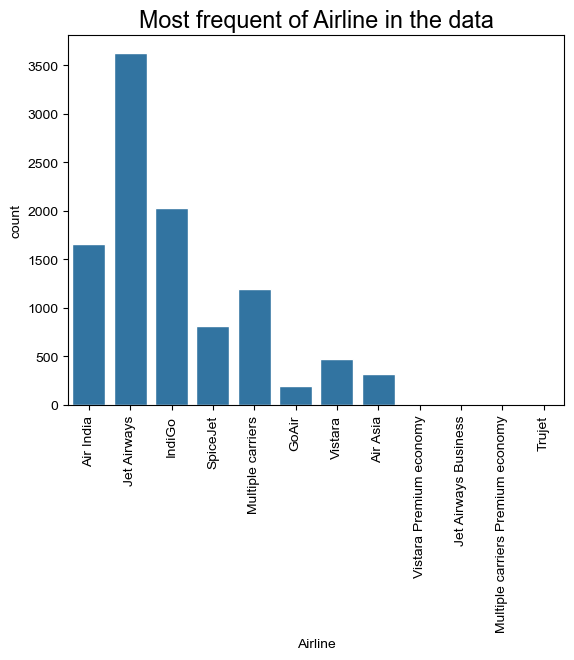

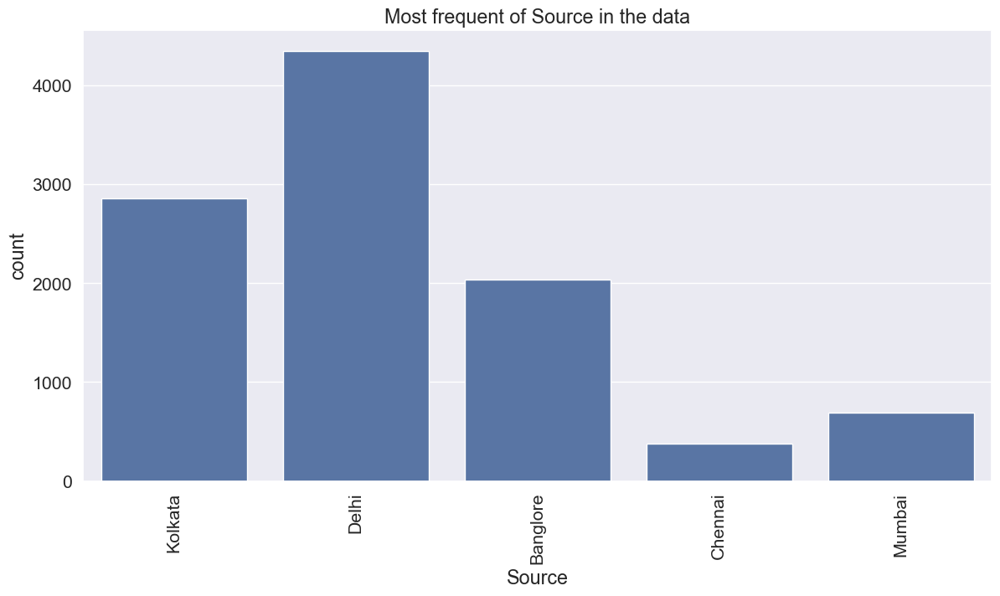

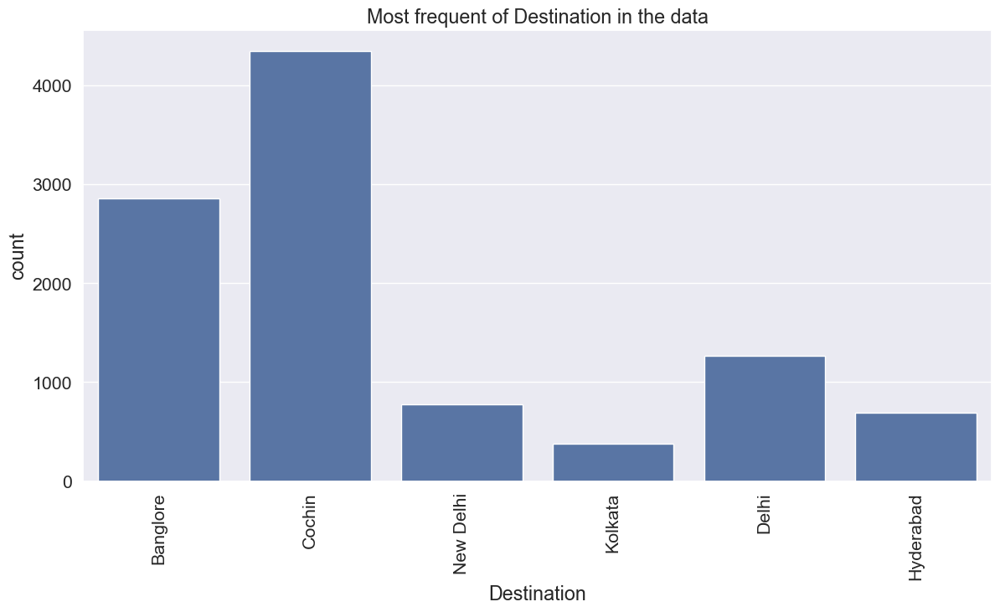

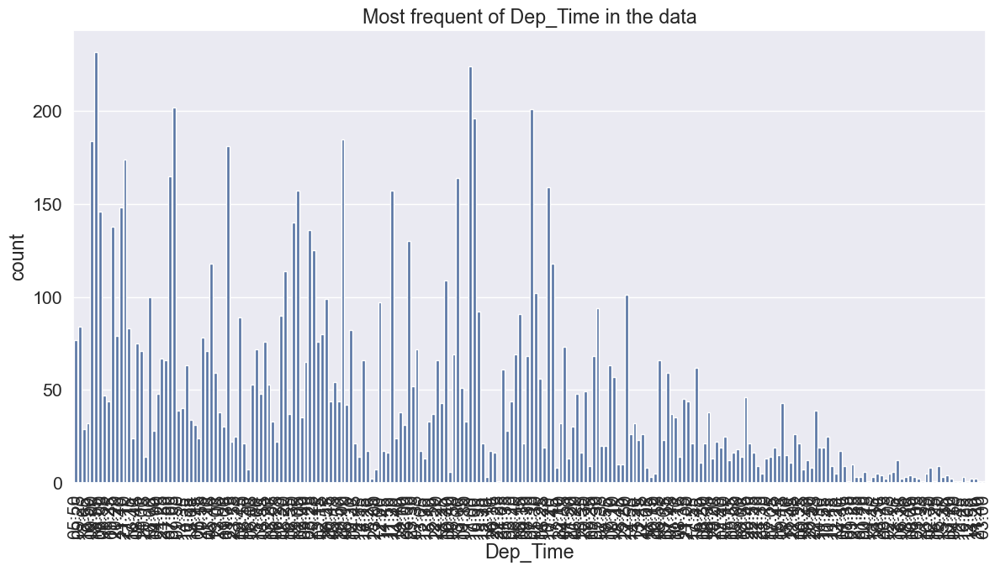

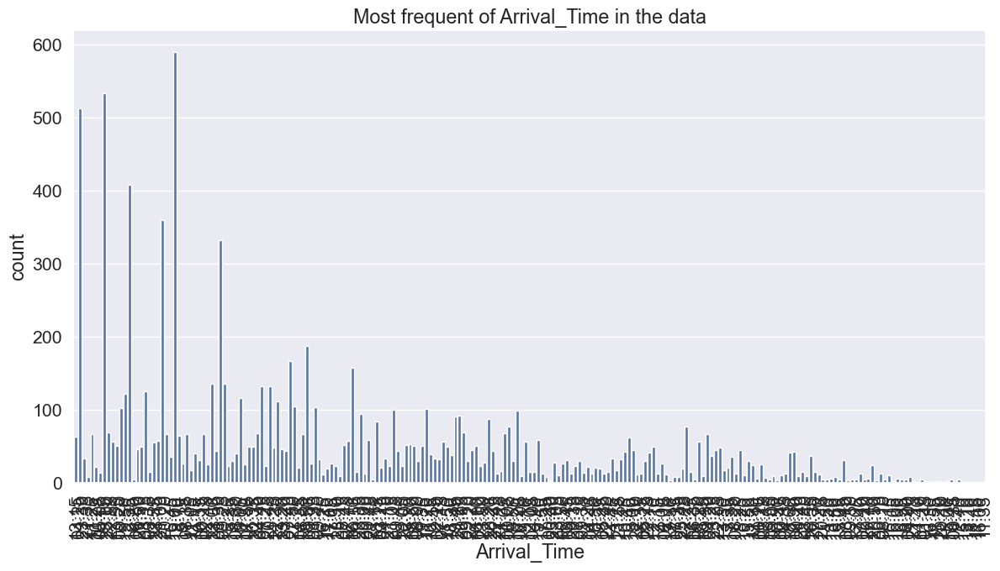

...

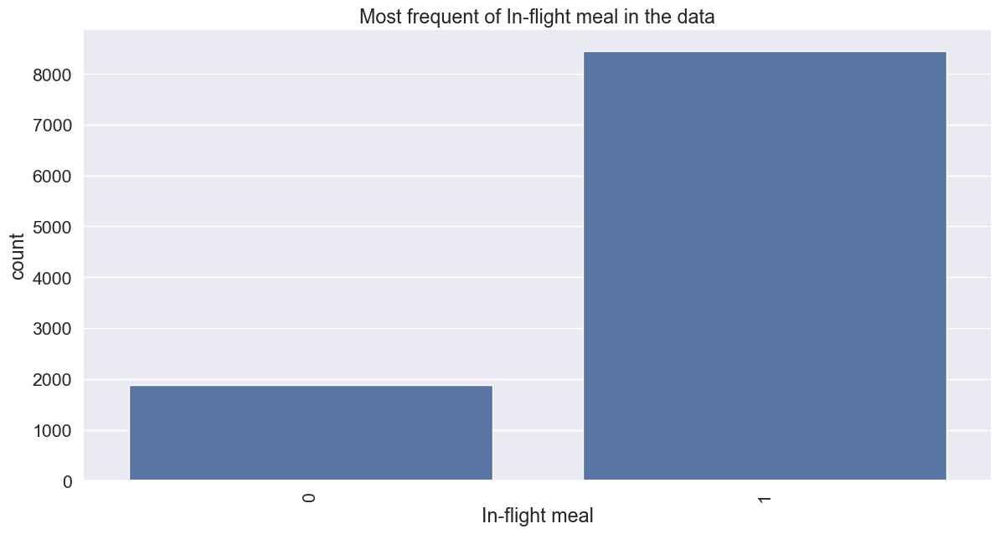

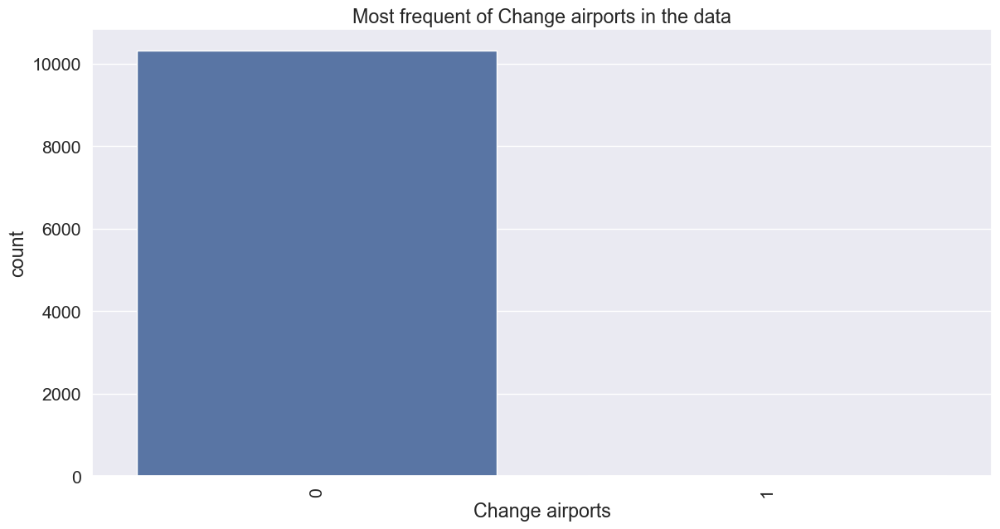

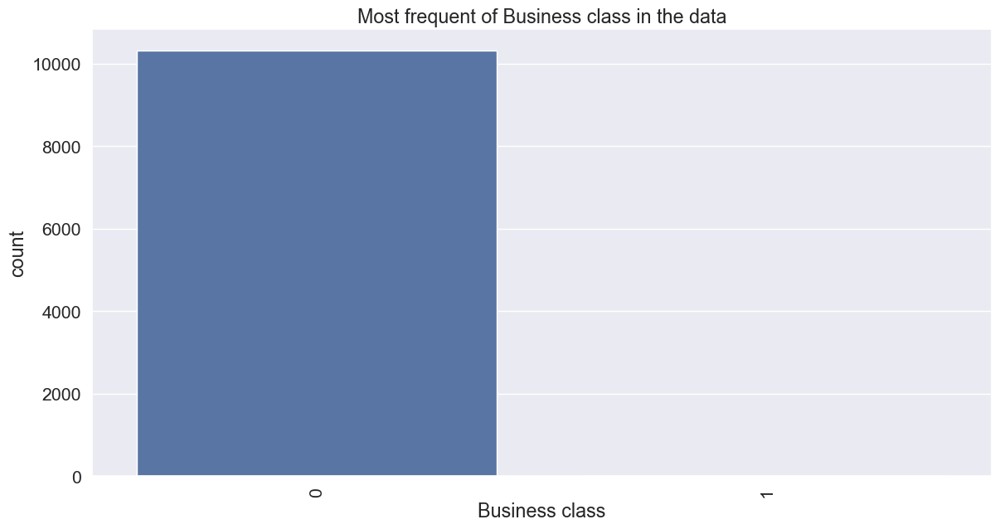

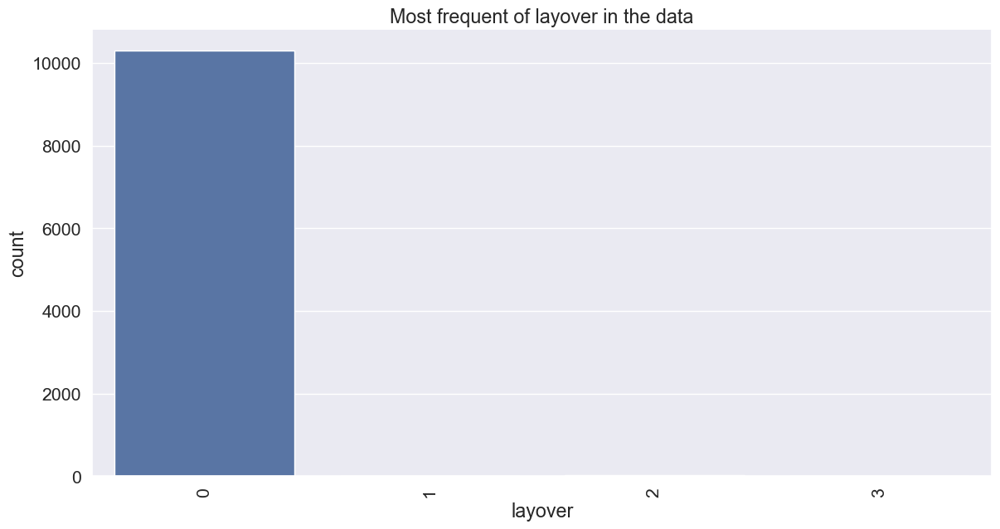

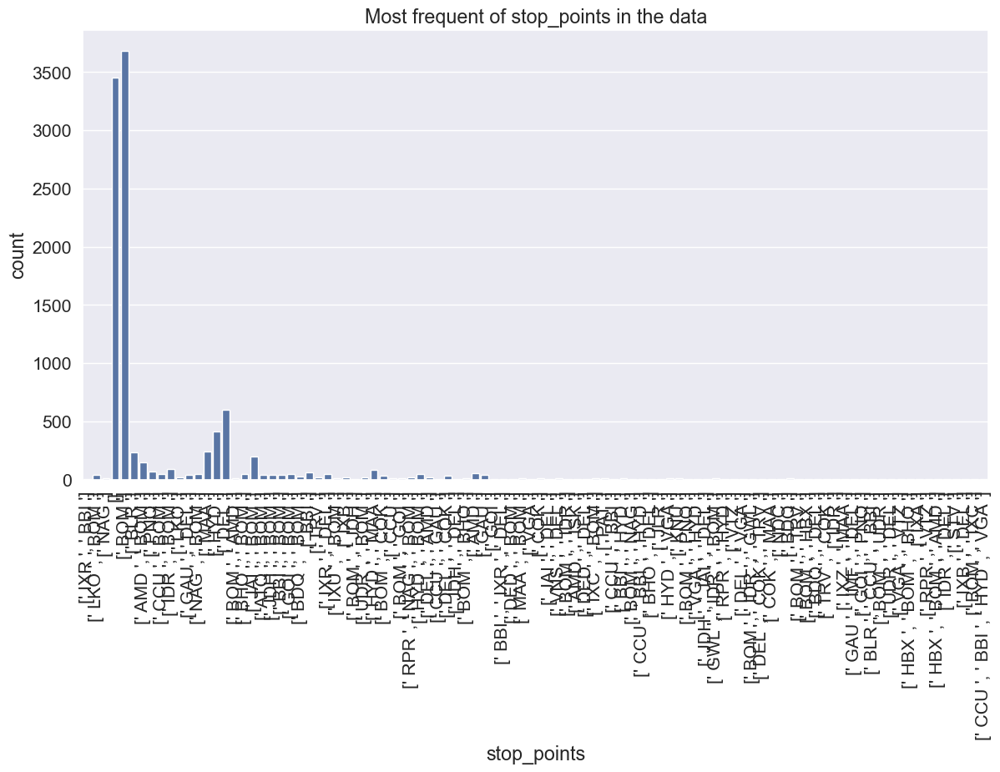

In [139]:
for col in cat:
    plt.xticks(rotation=90) # text rotation to vertical
    sns.set(rc={'figure.figsize': [14, 7]}, font_scale=1.4)  # Standard figure size for all.
    sns.countplot(df,x=col)
    plt.title(f'Most frequent of {col} in the data')
    plt.show()

In [140]:
df[ 'Dep_Time'].value_counts()[:20]

Dep_Time
18:55    232
17:00    224
07:05    202
07:10    201
10:00    196
20:00    185
09:00    184
09:35    181
21:10    174
07:00    165
13:00    164
10:20    159
14:05    157
11:30    157
11:40    148
08:00    146
06:30    140
09:45    138
08:25    136
06:00    130
Name: count, dtype: int64

In [141]:
df[ 'Dep_Time'].value_counts().tail(20)

Dep_Time
21:55    3
12:10    3
16:15    3
06:15    2
03:05    2
11:20    2
13:50    2
15:25    2
06:35    2
07:20    2
12:45    1
21:40    1
12:05    1
01:35    1
04:50    1
22:25    1
16:25    1
21:35    1
04:15    1
03:00    1
Name: count, dtype: int64

In [142]:
df['Arrival_Time'].value_counts()[:20]

Arrival_Time
19:00    590
19:15    533
04:25    512
12:35    408
21:00    360
01:30    332
18:50    187
07:40    166
16:10    157
09:25    135
12:00    135
04:40    132
20:45    132
08:15    125
19:50    122
10:05    116
22:30    111
22:50    104
01:35    103
09:20    102
Name: count, dtype: int64

In [143]:
df[ 'Arrival_Time'].value_counts().tail(20)

Arrival_Time
10:50    3
20:50    3
03:10    3
11:55    2
00:35    2
15:00    2
15:20    2
00:30    2
01:45    2
21:15    2
16:05    2
16:30    1
20:10    1
14:40    1
15:10    1
13:10    1
18:40    1
11:15    1
16:00    1
11:35    1
Name: count, dtype: int64

##### Most common routes

In [144]:
df.groupby(['Source','Destination','stop_points']).agg({
                'Date_of_Journey':'count'
                }).sort_values(by =  'Date_of_Journey',ascending=False)[:60]

Date_of_Journey
Source   Destination stop_points                                 
Delhi    Cochin      [' BOM ']                               2376
Banglore Delhi       []                                      1265
Kolkata  Banglore    [' BOM ']                                979
                     []                                       724
Mumbai   Hyderabad   []                                       620
Kolkata  Banglore    [' DEL ']                                565
Chennai  Kolkata     []                                       380
Delhi    Cochin      [' HYD ']                                326
Banglore New Delhi   [' BOM ']                                326
                     []                                       252
Delhi    Cochin      [' BLR ']                                232
                     []                                       213
                     [' JAI ', ' BOM ']                       183
                     [' MAA ']                                146
                     [' AMD ', ' BOM ']                       144
                     [' IDR ', ' BOM ']                        90
                     [' HYD ', ' MAA ']                        83
Kolkata  Banglore    [' MAA ']                                 65
                     [' HYD ']                                 53
                     [' BBI ']                                 50
Delhi    Cochin      [' BHO ', ' BOM ']                        48
Kolkata  Banglore    [' IXR ', ' DEL ']                        46
Delhi    Cochin      [' HYD ', ' BOM ']                        45
                     [' GOI ', ' BOM ']                        44
                     [' NAG ', ' BOM ']                        44
                     [' CCU ', ' BOM ']                        44
                     [' PNQ ']                                 42
Kolkata  Banglore    [' BBI ', ' BOM ']                        42
                     [' GAU ']                                 41
Delhi    Cochin      [' LKO ', ' BOM ']                        41
                     [' ATQ ', ' BOM ']                        40
Kolkata  Banglore    [' GAU ', ' DEL ']                        38
Delhi    Cochin      [' JDH ', ' BOM ']                        37
Banglore New Delhi   [' HYD ']                                 34
Mumbai   Hyderabad   [' DEL ']                                 33
Kolkata  Banglore    [' BOM ', ' COK ']                        30
                     [' DEL ', ' COK ']                        29
Delhi    Cochin      [' BDQ ', ' BOM ']                        27
Banglore New Delhi   [' MAA ']                                 26
Delhi    Cochin      [' AMD ']                                 25
Kolkata  Banglore    [' DEL ', ' AMD ']                        21
                     [' IXB ']                                 20
                     [' PNQ ']                                 19
Delhi    Cochin      [' UDR ', ' BOM ']                        18
                     [' LKO ']                                 17
Banglore New Delhi   [' AMD ']                                 16
Delhi    Cochin      [' TRV ']                                 16
                     [' RPR ', ' NAG ', ' BOM ']               15
Kolkata  Banglore    [' JAI ', ' BOM ']                        13
                     [' BOM ', ' GOI ']                        13
Delhi    Cochin      [' IXU ', ' BOM ']                        12
                     [' MAA ', ' BOM ']                        11
Kolkata  Banglore    [' AMD ']                                 11
Delhi    Cochin      [' IXC ', ' BOM ']                        11
Kolkata  Banglore    [' PAT ']                                 10
                     [' VNS ', ' DEL ']                        10
                     [' KNU ']                                 10
Banglore New Delhi   [' CCU ']                                 10
                     [' COK ']                                  9
Kolkata  Banglore    [' 

In [145]:
for col in num:
    fig= px.histogram(df,x=col,title=f'Distribution of {col} in the data')
    fig.show()

###### What airlines have minimum stops in average

In [146]:
df.groupby('Airline')['Total_Stops'].mean().sort_values()

Airline
Vistara Premium economy              0.000000
SpiceJet                             0.181818
IndiGo                               0.408083
Vistara                              0.452229
Air Asia                             0.466667
GoAir                                0.525773
Jet Airways                          0.978207
Multiple carriers Premium economy    1.000000
Trujet                               1.000000
Multiple carriers                    1.049331
Air India                            1.202662
Jet Airways Business                 1.333333
Name: Total_Stops, dtype: float64

In [147]:
df[df['Airline']=='Vistara Premium economy']

,Airline,Date_of_Journey,Source,Destination,Dep_Time,Arrival_Time,Duration,Total_Stops,Price,day_of_journey,month_of_journey,count_journey_days,dep_day_part,arrival_day_part,check-in baggage included,In-flight meal,Change airports,Business class,layover,stop_points
420,Vistara Premium economy,2019-03-03,Banglore,New Delhi,16:00,18:35,2.58,0,11793,3,3,0.0,afternoon,evening,1,1,0,0,0,[]
7455,Vistara Premium economy,2019-03-01,Chennai,Kolkata,07:05,09:20,2.25,0,9125,1,3,0.0,early morning,morning,1,1,0,0,0,[]
8374,Vistara Premium economy,2019-04-06,Banglore,Delhi,11:30,14:20,2.83,0,5969,6,4,0.0,morning,afternoon,1,1,0,0,0,[]


In [148]:
df.groupby('Total_Stops')['Price'].mean().sort_values()

Total_Stops
0     5016.152866
1    10578.214221
2    12778.147377
3    13282.166667
4    17686.000000
Name: Price, dtype: float64

In [149]:
cat

['Airline',
 'Source',
 'Destination',
 'Dep_Time',
 'Arrival_Time',
 'dep_day_part',
 'arrival_day_part',
 'day_of_journey',
 'month_of_journey',
 'check-in baggage included',
 'In-flight meal',
 'Change airports',
 'Business class',
 'layover',
 'stop_points']

###### what are most expensive airlines

In [150]:
df.groupby('Airline')['Price'].mean().sort_values(ascending=False)

Airline
Jet Airways Business                 58358.666667
Jet Airways                          11580.851586
Multiple carriers Premium economy    11418.846154
Multiple carriers                    10902.678094
Air India                             9544.557169
Vistara Premium economy               8962.333333
Vistara                               7793.815287
GoAir                                 5861.056701
IndiGo                                5665.982257
Air Asia                              5601.488889
SpiceJet                              4339.007371
Trujet                                4140.000000
Name: Price, dtype: float64

<Axes: xlabel='Airline', ylabel='Price'>

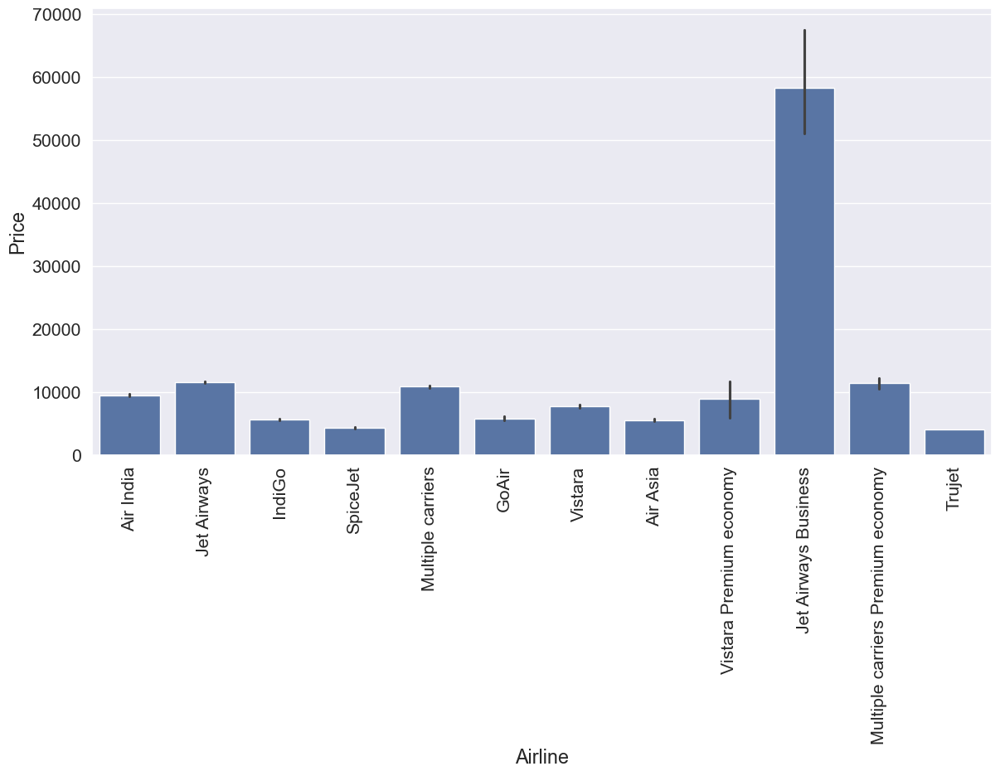

In [151]:
plt.xticks(rotation=90)
sns.barplot(df,x='Airline',y='Price')

###### what is most expensive Source in average (costs most)

<Axes: xlabel='Source', ylabel='Price'>

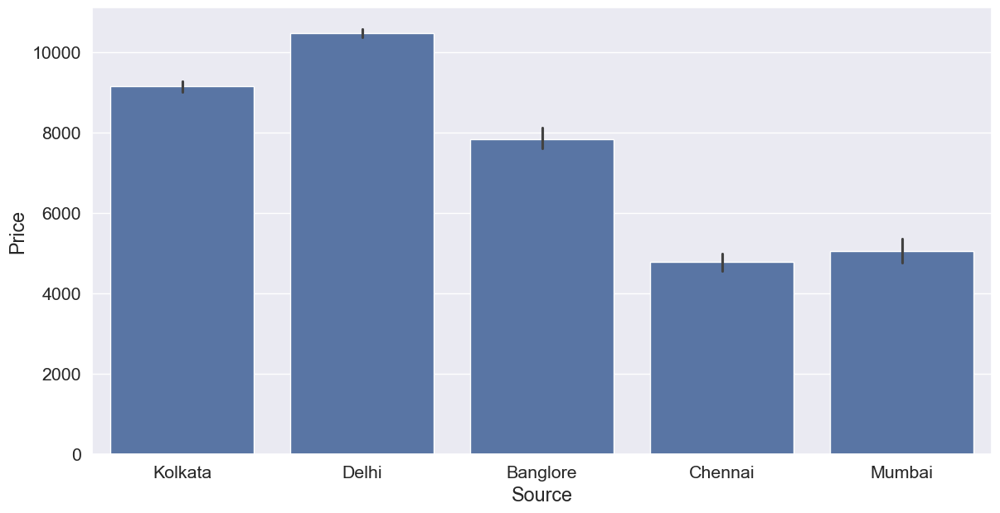

In [153]:
sns.barplot(df,x='Source',y='Price')

###### Distribution of Source according to price

In [152]:
px.strip(df,y='Source',x='Price')

###### what is  Destination that costs most in average

<Axes: xlabel='Destination', ylabel='Price'>

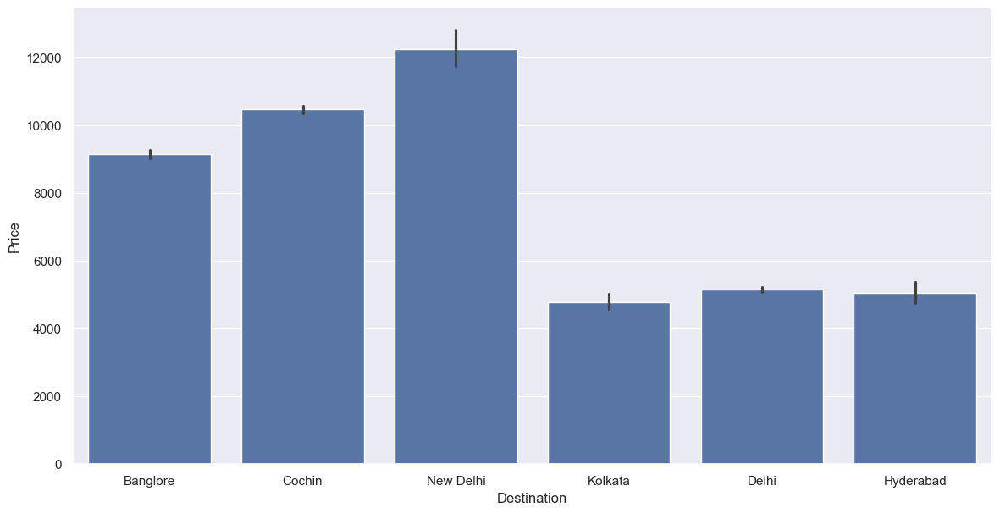

In [159]:
sns.barplot(df,x='Destination',y='Price')

###### Distribution of Destination according to price

In [161]:
px.strip(df,y='Destination',x='Price')

###### What is most expensive Source:Destination

In [188]:
df.groupby(['Source','Destination'])['Price'].mean().sort_values(ascending=False)

Source    Destination
Banglore  New Delhi      12244.495484
Delhi     Cochin         10461.600690
Kolkata   Banglore        9143.083566
Banglore  Delhi           5143.918577
Mumbai    Hyderabad       5046.807194
Chennai   Kolkata         4785.926316
Name: Price, dtype: float64

###### What is longest-duration (Source:Destination) and their average duration

In [155]:
df.groupby(['Source','Destination'])['Duration'].mean().sort_values(ascending=False)

Source    Destination
Delhi     Cochin         13.230449
Kolkata   Banglore       12.427136
Banglore  New Delhi       9.893819
Mumbai    Hyderabad       3.202432
Banglore  Delhi           2.861130
Chennai   Kolkata         2.325474
Name: Duration, dtype: float64

###### What are average stops for each (Source:Destination) 

In [156]:
df.groupby(['Source','Destination'])['Total_Stops'].mean().sort_values(ascending=False)

Source    Destination
Delhi     Cochin         1.174223
Kolkata   Banglore       0.856294
Banglore  New Delhi      0.761290
Mumbai    Hyderabad      0.155396
Banglore  Delhi          0.000000
Chennai   Kolkata        0.000000
Name: Total_Stops, dtype: float64

###### What are most expensive Routes

In [193]:
num

['Duration', 'Total_Stops', 'Price', 'count_journey_days']

In [157]:
df.groupby(['Source','Destination','stop_points'])['Price'].mean().sort_values(ascending=False)[:20]

Source    Destination  stop_points                         
Mumbai    Hyderabad    [' DED ', ' DEL ']                      24115.000000
                       [' JDH ', ' DEL ']                      23867.000000
                       [' VNS ', ' DEL ']                      23528.000000
                       [' UDR ', ' DEL ']                      22950.000000
                       [' BDQ ', ' DEL ']                      22792.500000
Banglore  New Delhi    [' BOM ', ' IDR ']                      20185.500000
Delhi     Cochin       [' DED ', ' BOM ']                      19539.500000
                       [' IXU ', ' BOM ']                      19381.333333
Banglore  New Delhi    [' BOM ', ' NAG ']                      19113.000000
                       [' BOM ', ' BHO ']                      18558.444444
Mumbai    Hyderabad    [' JDH ', ' JAI ', ' DEL ']             18293.000000
                       [' JAI ', ' DEL ']                      17926.000000
Banglore  New Delhi    [' CC

###### What are longest-duration Routes and their average duration

In [158]:
df.groupby(['Source','Destination','stop_points'])['Duration'].mean().sort_values(ascending=False)[:20]

Source    Destination  stop_points                         
Kolkata   Banglore     [' BBI ', ' IXR ', ' DEL ']             35.250000
Delhi     Cochin       [' RPR ', ' NAG ', ' BOM ']             34.912000
Kolkata   Banglore     [' IXB ', ' DEL ']                      33.330000
                       [' IXZ ', ' MAA ']                      32.920000
Mumbai    Hyderabad    [' JAI ', ' DEL ']                      31.830000
Banglore  New Delhi    [' BOM ', ' UDR ']                      31.670000
                       [' BOM ', ' IDR ', ' GWL ']             30.000000
Mumbai    Hyderabad    [' BHO ', ' DEL ']                      29.800000
                       [' JDH ', ' JAI ', ' DEL ']             29.580000
Banglore  New Delhi    [' CCU ', ' BBI ', ' HYD ', ' VGA ']    29.500000
                       [' BOM ', ' IXC ']                      29.080000
                       [' CCU ', ' BBI ', ' HYD ']             28.710000
                       [' TRV ', ' COK ']                      2

###### Routes that takes most days in average

In [159]:
df.groupby(['Source','Destination','stop_points'])['count_journey_days'].mean().sort_values(ascending=False)[:20]

Source    Destination  stop_points                
Delhi     Cochin       [' DED ', ' BOM ']             1.500000
                       [' UDR ', ' BOM ']             1.222222
                       [' AMD ', ' BOM ']             1.159722
Kolkata   Banglore     [' BOM ', ' COK ']             1.000000
Mumbai    Hyderabad    [' BLR ', ' CCU ', ' BBI ']    1.000000
                       [' BHO ', ' DEL ']             1.000000
                       [' BDQ ', ' DEL ']             1.000000
Banglore  New Delhi    [' TRV ', ' COK ']             1.000000
Mumbai    Hyderabad    [' BBI ']                      1.000000
Kolkata   Banglore     [' AMD ']                      1.000000
Delhi     Cochin       [' ATQ ', ' BOM ']             1.000000
Kolkata   Banglore     [' BOM ', ' GOI ']             1.000000
                       [' IXB ', ' DEL ']             1.000000
Mumbai    Hyderabad    [' DED ', ' DEL ']             1.000000
Delhi     Cochin       [' CCU ', ' BOM ']             1.000000
Kolk

###### what is most earned month_of_journey in average

<Axes: xlabel='Price', ylabel='month_of_journey'>

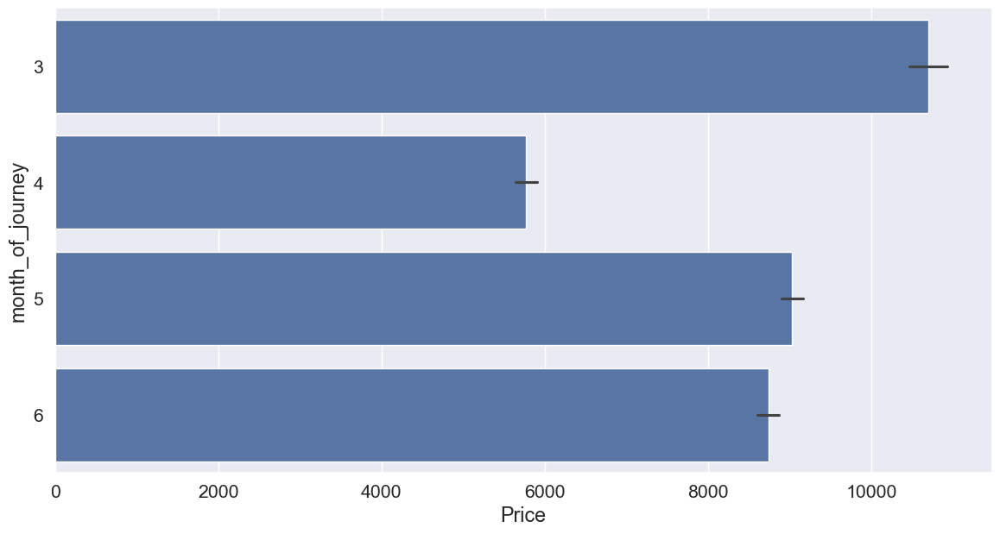

In [160]:
sns.barplot(df,x='Price',y='month_of_journey',orient='h')

###### what is most  earned  month_of_journey (sum)(How much earnings)

In [164]:
px.histogram(df,y='Price',x='month_of_journey')

###### what is most  earned  day_of_journey  in average

<Axes: xlabel='Price', ylabel='day_of_journey'>

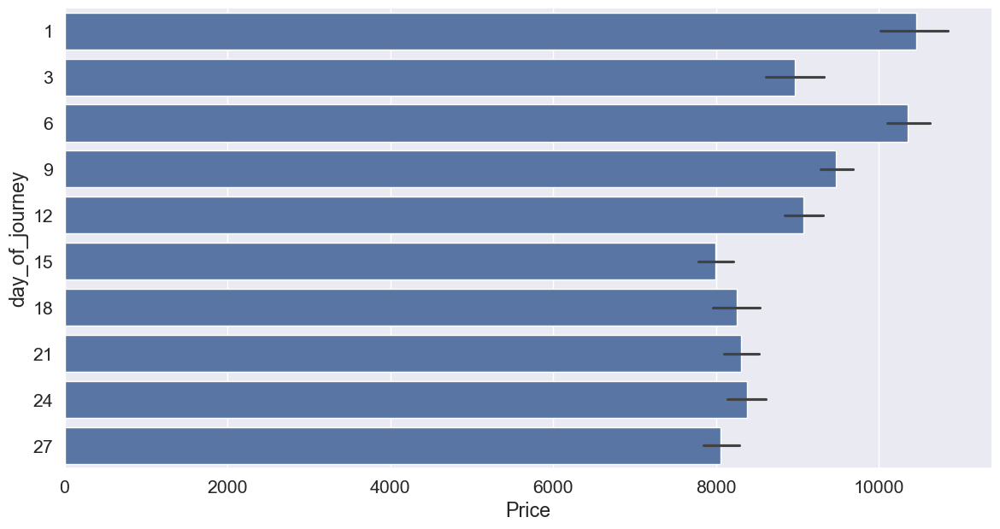

In [161]:
sns.barplot(df,x='Price',y='day_of_journey',orient='h')

###### what is most  earned  day_of_journey (sum)

In [162]:
px.histogram(df,y='Price',x='day_of_journey')

###### what is most expensive dep_day_part

In [163]:
dep_day_part_price = df.groupby('dep_day_part')['Price'].mean().sort_values(ascending=False)
dep_day_part_price

dep_day_part
morning          9490.365734
afternoon        9156.614961
evening          8871.304793
night            8687.119048
early morning    8669.456057
mid night        7712.568966
Name: Price, dtype: float64

<Axes: xlabel='Price', ylabel='dep_day_part'>

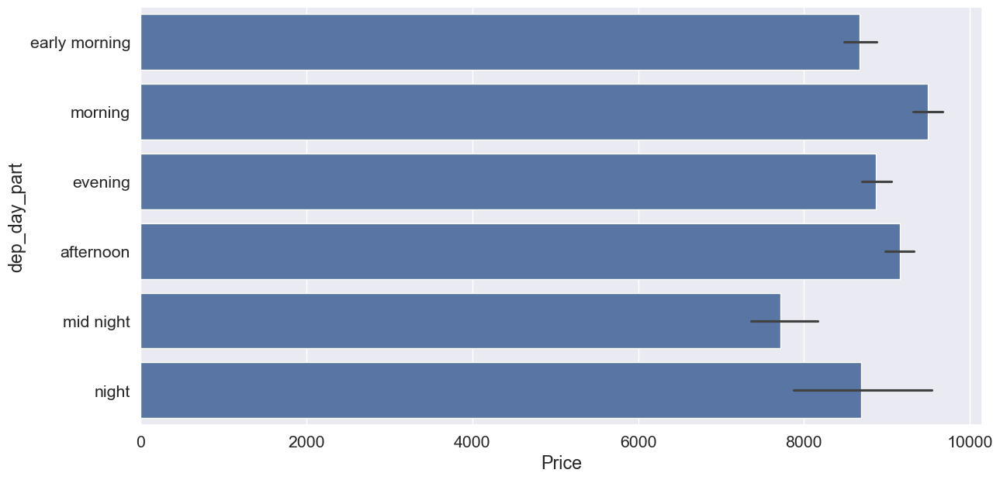

In [227]:
sns.barplot(df,x='Price',y= 'dep_day_part',orient='h')

###### what is most expensive arrival_day_part

In [141]:
arrival_day_part_price = df.groupby('arrival_day_part')['Price'].mean().sort_values(ascending=False)
arrival_day_part_price

arrival_day_part
evening          9632.950529
mid night        9315.052291
night            8945.071279
afternoon        8455.717153
early morning    8315.822134
morning          8208.832832
Name: Price, dtype: float64

<Axes: xlabel='Price', ylabel='arrival_day_part'>

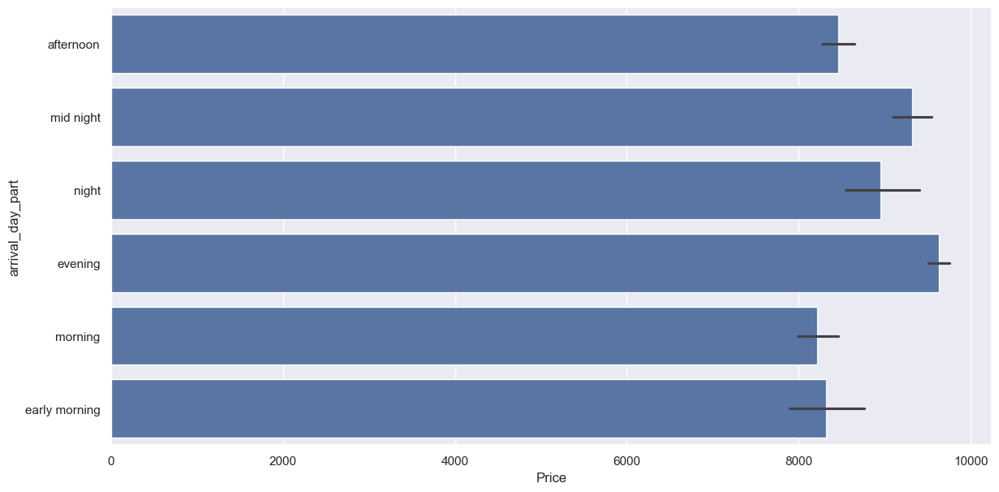

In [160]:
sns.barplot(df,x='Price',y= 'arrival_day_part',orient='h')

###### How it  differs in price for Additional_Info options in average 

In [ ]:
''''check-in baggage included',
 'In-flight meal',
 'Change airports',
 'Business class',
 'layover''''

<Axes: xlabel='Price', ylabel='layover'>

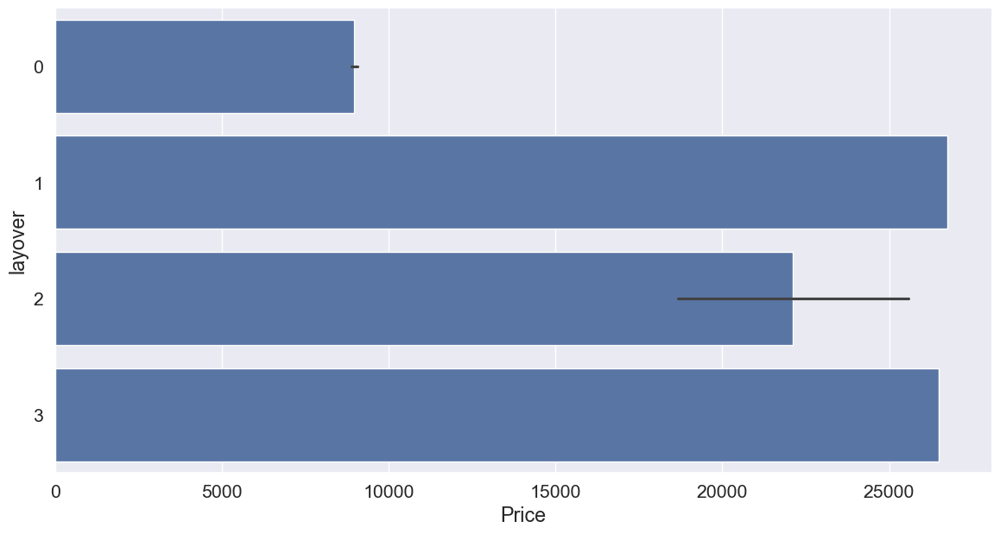

In [165]:
sns.barplot(df,x='Price',y= 'layover',orient='h')

In [166]:
px.strip(df,x='Price',y= 'layover')

<Axes: xlabel='Price', ylabel='check-in baggage included'>

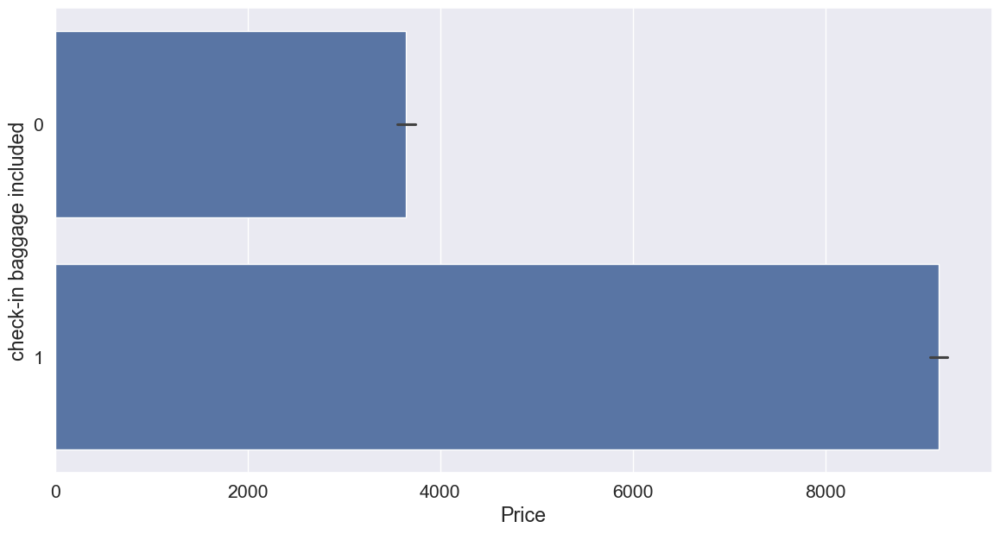

In [167]:
sns.barplot(df,x='Price',y= 'check-in baggage included',orient='h')

In [168]:
px.strip(df,x='Price',y= 'check-in baggage included')

<Axes: xlabel='Price', ylabel='In-flight meal'>

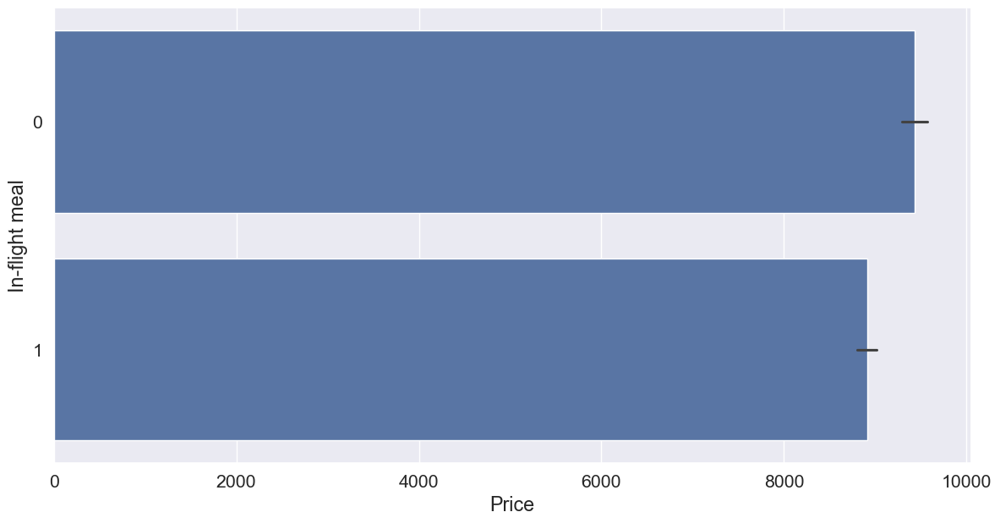

In [169]:
sns.barplot(df,x='Price',y= 'In-flight meal',orient='h')

<Axes: xlabel='Price', ylabel='In-flight meal'>

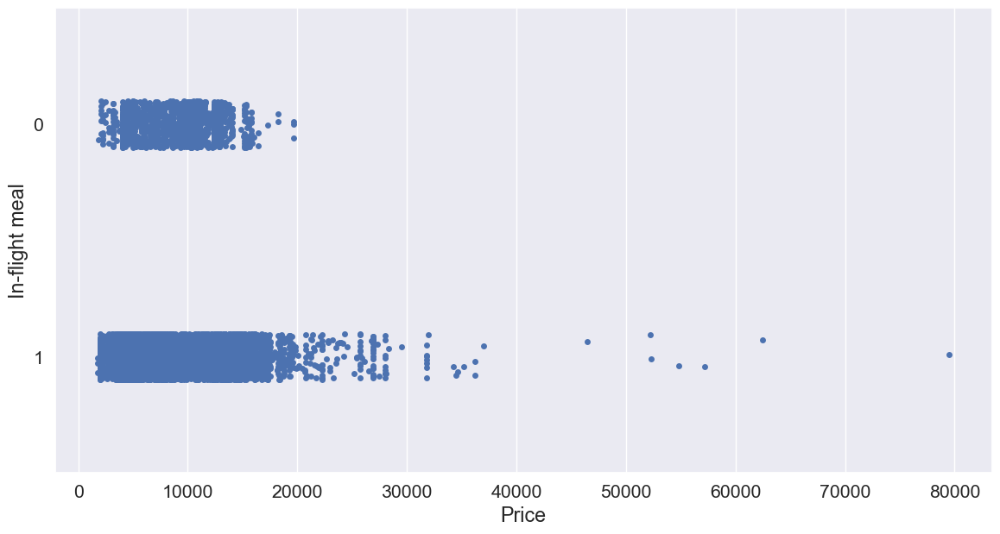

In [170]:
sns.stripplot(df,x='Price',y= 'In-flight meal',orient='h')

<Axes: xlabel='Price', ylabel='Change airports'>

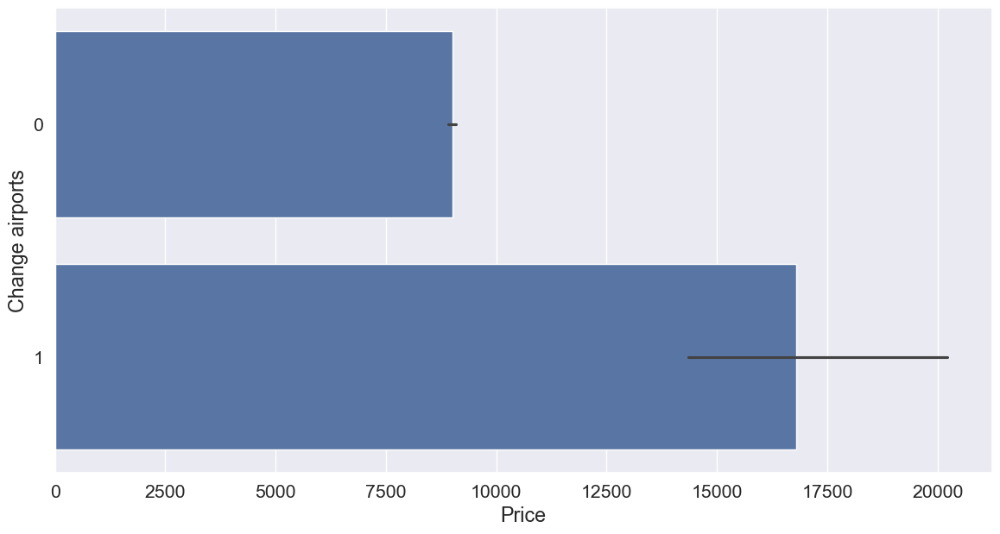

In [171]:
sns.barplot(df,x='Price',y= 'Change airports',orient='h')

In [172]:
px.strip(df,x='Price',y= 'Change airports')

<Axes: xlabel='Price', ylabel='Business class'>

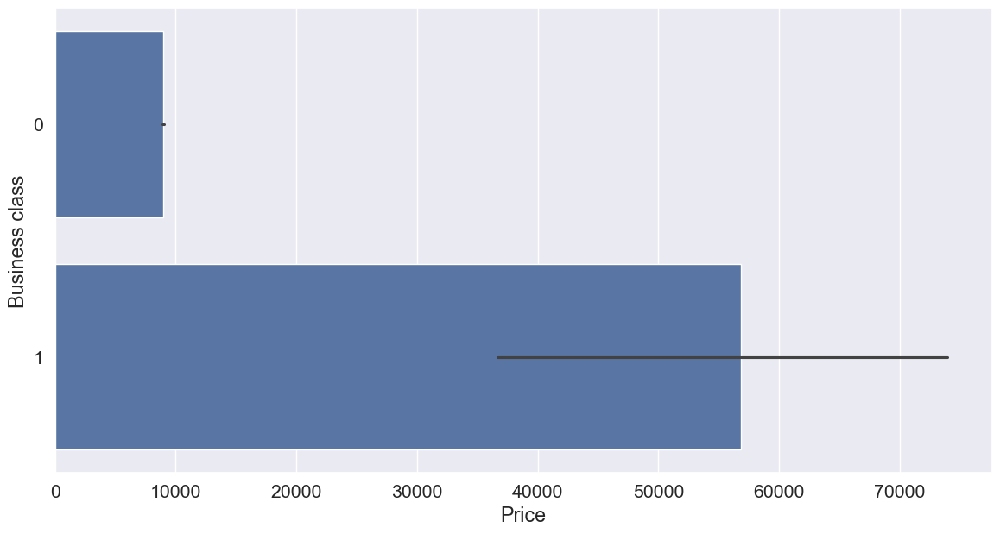

In [173]:
sns.barplot(df,x='Price',y= 'Business class',orient='h')

In [174]:
px.strip(df,x='Price',y= 'Business class')

In [175]:
px.imshow(df.corr(numeric_only=True).round(4),text_auto=True,width=1000,height=800)

In [176]:
px.scatter(df,x='Duration',y='Price',trendline='ols')

In [177]:
px.scatter(df,x='Total_Stops',y='Price',trendline='ols')

In [178]:
px.scatter(df,x='count_journey_days',y='Price',trendline='ols')

In [186]:
Airlines_earnings_over_days = df.groupby(['Airline','Date_of_Journey']).agg({
                                                    'Price':'mean'
                                                }).reset_index()
Airlines_earnings_over_days

,Airline,Date_of_Journey,Price
0,Air Asia,2019-03-01,8293.000000
1,Air Asia,2019-03-03,9012.166667
2,Air Asia,2019-03-06,6081.200000
3,Air Asia,2019-03-09,6187.111111
4,Air Asia,2019-03-12,4233.000000
...,...,...,...
307,Vistara,2019-06-24,5872.875000
308,Vistara,2019-06-27,5694.900000
309,Vistara Premium economy,2019-03-01,9125.000000
310,Vistara Premium economy,2019-03-03,11793.000000


In [188]:
px.line(Airlines_earnings_over_days,x='Date_of_Journey',y='Price',color='Airline')

<Axes: xlabel='Date_of_Journey', ylabel='Price'>

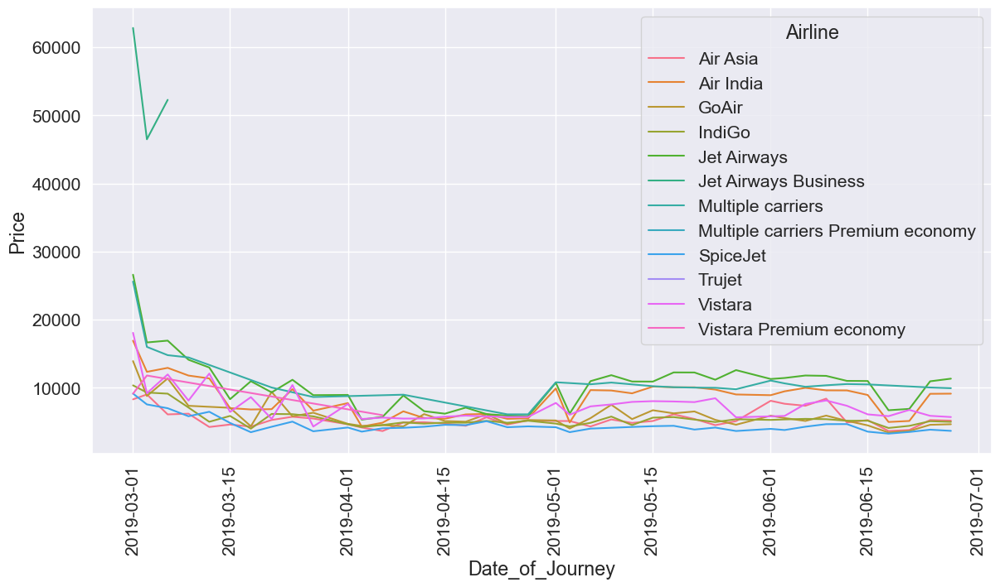

In [187]:
plt.xticks(rotation=90) # text rotation to vertical
sns.set(rc={'figure.figsize': [14, 7]}, font_scale=1.4)  # Standard figure size for all
sns.lineplot(Airlines_earnings_over_days,x='Date_of_Journey',y='Price',hue='Airline')

In [189]:
df[df['Airline']=='Jet Airways Business']

,Airline,Date_of_Journey,Source,Destination,Dep_Time,Arrival_Time,Duration,Total_Stops,Price,day_of_journey,month_of_journey,count_journey_days,dep_day_part,arrival_day_part,check-in baggage included,In-flight meal,Change airports,Business class,layover,stop_points
649,Jet Airways Business,2019-03-01,Banglore,New Delhi,05:45,10:45,5.00,1,52229,1,3,0.0,early morning,morning,1,1,0,0,0,[' BOM ']
2866,Jet Airways Business,2019-03-01,Banglore,New Delhi,05:45,11:25,5.67,1,79512,1,3,0.0,early morning,morning,1,1,0,1,0,[' BOM ']
5243,Jet Airways Business,2019-03-01,Banglore,New Delhi,05:45,12:25,6.67,1,62427,1,3,0.0,early morning,afternoon,1,1,0,1,0,[' BOM ']
7159,Jet Airways Business,2019-03-03,Delhi,Cochin,20:05,04:25,8.33,2,46490,3,3,1.0,evening,mid night,1,1,0,0,0,"[' ATQ ', ' BOM ']"
9412,Jet Airways Business,2019-03-06,Delhi,Cochin,20:05,04:25,8.33,2,52285,6,3,1.0,evening,mid night,1,1,0,0,0,"[' ATQ ', ' BOM ']"
10024,Jet Airways Business,2019-03-01,Banglore,New Delhi,09:45,14:25,4.67,1,57209,1,3,0.0,morning,afternoon,1,1,0,1,0,[' MAA ']
